# Validation (1 file for the whole period)

Validation script for simulation outputs, using the validation function validacia_v2.py
Validation function used in this notebook is designed for model outputs in the netCDF4 format, with one file for each pollutant for the whole specified period.

Using the validation function validacia_v2.py

It is possible to validate arbitrary number of simulations at the same time.
For simulations with different simulation output formats the validation function may have to be adjusted.

The following inputs are required for each simulation individually:
   - model name
   - grid name 
   - the start and end of the simulated period (YYYY-MM-DD hh:mm:ss)
   - path to model outputs
   
All of the user inputs are adjusted in the following cell.

By default, the tables and figures are not saved. 
If you wish to save a product, change the "save" variable for the corresponding product to True.
For the individual products, the user may choose a season or a month for which the product will be made.

The colors used in the figures for each simulation can be adjusted in the next cell as well.

The plotting period can be easily adjusted for the figures by entering the starting and ending day. 
Some figures use averages of a specific season or a month, which can also be selected.

Je mozne rucne vypisat, ktore stanice chcem vyplotit, alebo zvolit vsetky stanice.

## User input

In [1]:
### USER INPUT
# For each model simulation the model name and grid name must be given, 
# even though these names might be the same for all simulations
# The order of inputs for individual simulations must be held in all lists 
# - 2nd simulation name corresponds to 2nd grid name, 2nd start_date etc.

nick = 'const_emis_cop'   # specific name for this validation, will be in names of output figures & tables (make it rather short)
folder_name = 'CMAQ2017d02_ref_vs_cop_vs_const'   #folder for saving inputs of this validation (/vali_path/validated/folder_name)
specific = ['ref','cop','rh_const','tot_const']   # specific name for each simulation 
model_name = ['CMAQ', 'CMAQ', 'CMAQ', 'CMAQ']    # corresponding model name
grid_name = ['d02','d02','d02','d02']   # corresponding grid name

# the whole period, that the individual simulations cover
start_date = ['2017-01-01 00:00:00', '2017-01-01 00:00:00', '2017-01-01 00:00:00','2017-01-01 00:00:00'] 
end_date = ['2017-12-31 23:59:59', '2017-12-31 23:59:59', '2017-12-31 23:59:59','2017-12-31 23:59:59']

v = 'NO2'  # pollutant name in the models
# paths to model outputs of the individual simulations 
path = {'ref':'/data/oko/dusan/POST/WB_2020_{0}_2017'.format(v),
        'rh_const':'/data/oko/dusan/POST/WB_const_{0}_2017'.format(v),
        'cop':'/data/oko/dusan/POST/WB_2017_d02_CAMS_13_res_heat_{0}_2017'.format(v),
       'tot_const':'/data/oko/dusan/POST/WB_totcons_{0}_2017'.format(v)} 

vali_path = '/data/teri/validacia'  # folder with validation function. 
save_path = '{0}/validated/{1}/{2}'.format(vali_path,folder_name,v)
#The outputs are saved to /vali_path/validated/folder_name/v

stations_table = 'Validation_scripts/stations_table_example.csv' # table with x and y coordinates within the used table, saved in vali_path folder
# see README for instructions on creating "Stations table"

obs_color = 'r'  # the color for observations in the plots
#obs_color = 'darkred'

colors = ['k','b','g','fuchsia' ]   # colours for simulations in the plots
#colors = ['darkred','slateblue','orange','green','indigo']
#colors = ['darkred','black','slateblue','green','indigo']
color_list = {}
for i in range(0,len(specific)):
    color_list[specific[i]] = colors[i]

In [2]:
units = 'ug/m3'    # units for your pollutant
locs = ['S','R','U']   # station locations
types = ['B','T','I']   # station types
all_types = locs + types  
all_types_all = locs + types + ['all']

season = ['spring','summer','autumn','winter','year']
season_months = {'spring':[3,4,5], 'summer':[6,7,8], 'autumn':[9,10,11], 'winter':[1,2,12], 'year':list(range(1,13)),
                'jan':[1], 'feb':[2], 'mar':[3], 'apr':[4], 'may':[5], 'jun':[6], 'jul':[7], 'aug':[8],
                'sep':[9], 'okt':[10], 'nov':[11], 'dec':[12], 'summer_time':[4,5,6,7,8,9,10], 'winter_time':[11,12,1,2,3]}

#Choose from the following statistics to be used in tables
# R - Pearson correlation coefficient, MB - mean bias, MPE - mean percentual error (percentual bias)
# MGE - Mean gross error, MGPE - mean gross percential error, RMSE - root mean square error
# RMSPE - root mean square percentual error, FAC2 - factor of two
#statistics = ['R','MB','MPE','MGE','MGPE','RMSE','RMSPE','FAC2']
statistics = ['R','MB','RMSE','FAC2']   # statistics to be used in tables

In [3]:
### NOT USER INPUT
import numpy as np
import pandas as pd
from IPython.display import Image, display
import matplotlib.pyplot as plt
import os
import sys
sys.path.append(vali_path)
import validacia_v2 as vali
import xarray as xr

graphs_path = '{0}/graphs'.format(save_path)
tables_path = '{0}/tables'.format(save_path)

if not os.path.exists(graphs_path):
            os.makedirs(graphs_path)
        
if not os.path.exists(tables_path):
            os.makedirs(tables_path)
        
# NMSKO stations 
stations = pd.read_csv('{0}/{1}'.format(vali_path,stations_table))
pd.set_option('display.max_columns', 25)
pd.set_option('display.max_rows', 500)
stations

Making connection to database 10.20.7.200
Working on query: 
select * from si.si left join si.si_ext_nmsko as e on e.si_id=si.id where ci=78


,Unnamed: 0,id,ci,ii,name,cccc,cc,iso_cc,lat,lon,elev,info,...,SO2,NO,NO2,NOx,CO,BEN,H2S,O3,coord,x,y,lat_lon
0,0,78001,78,11813,"BRATISLAVA, JESENIOVA",NaN,SK,703,48.167952,17.106209,283.0,NaN,...,1,1,1,1,0,0,0,1,"(21, 92)",21,92,"(48.152134, 17.130432)"
1,1,78002,78,11916,"CHOPOK, EMEP",NaN,SK,703,48.943620,19.589236,1958.0,NaN,...,0,1,1,1,0,0,0,1,"(40, 130)",40,130,"(48.928993, 19.58075)"
2,2,78003,78,11952,"GANOVCE, METEO. ST.",NaN,SK,703,49.034601,20.322844,682.0,NaN,...,0,1,1,1,0,0,0,1,"(43, 141)",43,141,"(49.038628, 20.296814)"
3,3,78004,78,11958,KOJSOVSKA HOLA,NaN,SK,703,48.782875,20.987112,1230.0,NaN,...,0,1,1,1,0,0,0,1,"(37, 152)",37,152,"(48.76358, 20.986572)"
4,4,78005,78,99111,"BRATISLAVA, MAMATEYOVA",NaN,SK,703,48.124692,17.125400,134.0,NaN,...,1,1,1,1,0,0,1,1,"(20, 92)",20,92,"(48.10979, 17.13034)"
5,5,78006,78,99112,"BRATISLAVA, TRNAVSKE MYTO",NaN,SK,703,48.158359,17.128891,140.0,NaN,...,0,1,1,1,1,1,0,0,"(21, 92)",21,92,"(48.152134, 17.130432)"
6,6,78007,78,99114,"BRATISLAVA, KAMENNE NAM.",NaN,SK,703,48.144670,17.113543,146.0,NaN,...,0,0,0,0,0,0,0,0,"(21, 92)",21,92,"(48.152134, 17.130432)"
7,7,78008,78,99122,"SENICA, HVIEZDOSLAVOVA",NaN,SK,703,48.680681,17.363110,207.0,NaN,...,1,0,0,0,0,0,0,0,"(33, 96)",33,96,"(48.659653, 17.388062)"
8,8,78009,78,99123,"TRNAVA, KOLLAROVA",NaN,SK,703,48.371385,17.584926,144.0,NaN,...,0,1,1,1,1,1,0,0,"(26, 99)",26,99,"(48.36253, 17.577057)"
9,9,78038,78,99126,TRNOVEC NAD VAHOM,NaN,SK,703,48.150000,17.928600,114.0,NaN,...,0,0,0,0,0,0,0,0,"(21, 105)",21,105,"(48.14837, 17.955536)"


## Validation function

In [ ]:
stat, data = {}, {}
for i, key in enumerate(specific):
    print(key)
    stat[key], data[key] = vali.validation(path[key], model_name[i], grid_name[i], start_date[i], end_date[i], v)

ref
Making connection to database 10.20.7.200
Working on query: 
select si.ii,si.lat,si.lon,si.elev, o.* from obs.obs_nmsko_1h o join si.si on si.id=o.si_id where ii=11813 and date between '2017-01-01 01:00:00' and '2018-01-01 00:00:00'
Making connection to database 10.20.7.200
Working on query: 
select si.ii,si.lat,si.lon,si.elev, o.* from obs.obs_nmsko_1h o join si.si on si.id=o.si_id where ii=11916 and date between '2017-01-01 01:00:00' and '2018-01-01 00:00:00'
Making connection to database 10.20.7.200
Working on query: 
select si.ii,si.lat,si.lon,si.elev, o.* from obs.obs_nmsko_1h o join si.si on si.id=o.si_id where ii=11952 and date between '2017-01-01 01:00:00' and '2018-01-01 00:00:00'
Making connection to database 10.20.7.200
Working on query: 
select si.ii,si.lat,si.lon,si.elev, o.* from obs.obs_nmsko_1h o join si.si on si.id=o.si_id where ii=11958 and date between '2017-01-01 01:00:00' and '2018-01-01 00:00:00'
Making connection to database 10.20.7.200
Working on query: 
sel

In [ ]:
stat['ref']


# Statistics tables

## All stations

A table for all stations with statistics for each simulation

In [ ]:
### USER INPUT
my_season = 'year'   #select the period you want to validate - year, spring, summer..., jan, feb, mar...
save = False
non_zero = False # only show stations with coverage above 0

#############################################################################################
stat_all = stat[specific[0]][['name','loc','type','coverage','obs_mean']].copy()

for s in statistics:
    for i in specific:
        stat_all['{0}_{1}'.format(s,i)] = pd.Series(dtype = 'float64')

for i in specific:   
    for s in stat_all.index:
        
        if s == 'all':
            obs = data[i]['OBS'].sel(time = data[i].time.dt.month.isin(season_months[my_season])).to_series()
            mod = data[i]['MOD'].sel(time = data[i].time.dt.month.isin(season_months[my_season])).to_series()
        else: 
            obs = data[i]['OBS'].sel(station = s, time = data[i].time.dt.month.isin(season_months[my_season])).to_series()
            mod = data[i]['MOD'].sel(station = s, time = data[i].time.dt.month.isin(season_months[my_season])).to_series()

        if 'R' in statistics:
            stat_all.at[s,'R_{0}'.format(i)] = obs.corr(mod)
        diff = (mod - obs).to_numpy()
        diff = diff[~np.isnan(diff)]
        obs[obs == 0] = np.nan
        obs_ = obs[~np.isnan(obs)]
        stat_all.at[s, 'obs_mean'] = np.nanmean(obs)
        podiel = (mod/obs).to_numpy()
        podiel = podiel[~np.isnan(podiel)]
        podiel_fac2 = podiel[podiel <= 2]
        podiel_fac2 = podiel_fac2[podiel_fac2 >= 0.5]
        
        if len(diff) != 0:    
            if 'MB' in statistics:
                stat_all.at[s, 'MB_{0}'.format(i)] = np.sum(diff)/len(diff)  #mean bias
            if 'MPE' in statistics:
                stat_all.at[s, 'MPE_{0}'.format(i)] = 100*np.sum(diff/obs_)/len(diff)   #mean percental error (bias)
            if 'MGE' in statistics:    
                stat_all.at[s,'MGE_{0}'.format(i)] = np.sum(np.absolute(diff))/len(diff)  #mean gross error
            if 'MGPE' in statistics:
                stat_all.at[s,'MGPE_{0}'.format(i)] = 100*np.sum(np.absolute(diff/obs_))/len(diff)  #mean gross percentual error
            if 'RMSE' in statistics:
                stat_all.at[s,'RMSE_{0}'.format(i)] = np.sqrt(np.sum(diff**2)/len(diff))  #root mean square error
            if 'RMSPE' in statistics:
                stat_all.at[s,'RMSPE_{0}'.format(i)] = 100*np.sqrt(np.sum((diff/obs_)**2)/len(diff)) #root mean square percentual error
            if 'FAC2' in statistics:
                if len(podiel) != 0:
                    stat_all.at[s,'FAC2_{0}'.format(i)] = 100*len(podiel_fac2)/len(podiel)   # factor of 2

if save:
    stat_all.to_csv('{0}/vali_{1}_allstat_{2}_{3}.csv'.format(tables_path,nick,my_season,v))
    
if non_zero:
    display(stat_all.loc[stat_all.coverage != 0])    
else:
    display(stat_all)

In [7]:
# DISPLAY THE TABLE WITH A CONDITION
stat_all.loc[stat_all.R_ref >= 0.5]

,name,loc,type,coverage,obs_mean,R_ref,R_cop,R_rh_const,R_tot_const,MB_ref,MB_cop,MB_rh_const,MB_tot_const,RMSE_ref,RMSE_cop,RMSE_rh_const,RMSE_tot_const,FAC2_ref,FAC2_cop,FAC2_rh_const,FAC2_tot_const
11813,"BRATISLAVA, JESENIOVA",S,B,94.0982,14.2364,0.585451,0.583708,0.573583,0.450903,-4.953463,-4.348507,-4.363299,-3.276929,11.095779,10.893993,10.981723,11.837519,60.378503,62.780541,62.816936,57.418416
99111,"BRATISLAVA, MAMATEYOVA",U,B,95.1826,23.6776,0.550984,0.550335,0.546424,0.475635,-13.860814,-13.338439,-13.341991,-12.213972,20.145817,19.752573,19.786314,19.570339,32.345886,34.924442,34.912449,40.441353
99134,"NITRA, JANIKOVCE",U,B,95.2626,14.0086,0.532286,0.545247,0.532561,0.521338,-9.221580,-8.840102,-8.857088,-8.168743,14.570613,14.219727,14.297982,13.921038,27.573397,31.899341,32.198922,40.131815
99214,"BANSKA BYSTRICA, STEFANIKOVO NABREZIE",U,T,93.7557,37.8448,0.553228,0.557244,0.547996,0.372925,-33.391821,-32.936503,-32.956417,-32.480554,40.704079,40.208685,40.271460,40.385084,4.298064,5.052965,5.065141,8.316084
99215,"BANSKA BYSTRICA, ZELENA",U,B,93.0479,12.9696,0.548006,0.548625,0.531996,0.485008,-9.314385,-8.977509,-9.020565,-8.716974,15.293780,14.997545,15.116572,15.119149,30.916452,34.498834,34.903693,38.277512
99246,"PRIEVIDZA, MALONECPALSKA",U,B,96.6667,19.254,0.500871,0.503916,0.488751,0.394150,-14.086740,-13.653837,-13.676316,-13.386968,19.318627,18.937555,19.035785,19.258930,20.807747,23.559282,23.901748,28.471894
99252,"ZILINA, OBEZNA",U,B,98.1279,24.7692,0.503335,0.521656,0.502565,0.383761,-19.844533,-19.482454,-19.522341,-19.058643,25.381404,24.991499,25.118668,25.111556,9.969753,11.191252,11.261052,15.751512
99281,"JELSAVA, JESENSKEHO",U,B,96.3699,9.93387,0.552427,0.560162,0.550718,0.516878,-7.375919,-7.175587,-7.180426,-6.860144,11.330128,11.143191,11.173155,11.051016,24.946695,27.623786,28.144989,31.734186
99401,"TOPOLNIKY, ASZOD, EMEP",R,B,97.6941,7.93756,0.587741,0.593092,0.586743,0.549862,-3.851494,-3.676014,-3.682521,-3.185591,5.981427,5.853585,5.877688,5.709178,47.078757,49.602711,49.953260,55.059593
99403,"STARINA, VODNA NADRZ, EMEP",R,B,96.3242,3.34142,0.565006,0.568200,0.564908,0.548404,-1.521324,-1.485823,-1.487212,-1.476364,3.147662,3.124099,3.131354,3.161638,49.336336,50.118511,50.035553,49.514103


In [8]:
# MAKE A SELECTION FROM THE STATIONS BASED ON A CONDITION

# here, background stations with non-zero coverage are selected
ID_B = list(stat_all.loc[stat_all.type == 'B'].loc[stat_all.coverage != 0].index.values)  
ID_B

[11813,
 11916,
 11952,
 11958,
 99111,
 99134,
 99215,
 99224,
 99246,
 99252,
 99281,
 99351,
 99401,
 99403,
 99404]

## Station types

A table for station types with statistics for each simulation

In [9]:
### USER INPUT
my_season = 'year'   #select the period you want to validate - year, spring, summer..., jan, feb, mar...
save = False
non_zero = True # only show stations with coverage above 0

# so far, the following station types are available. 
#stat_types_mine = ['all','RB', 'OB', 'UT', 'I'] 

stat_types_mine = ['all','RB', 'OB', 'UT']

#########################################################################################################
stat_types = pd.DataFrame(index = stat_types_mine, columns = ['n']+list(stat_all.columns)[3:])

for i in specific:
    for t in stat_types_mine:
        if t == 'RB':
            selected_stations = list(stat_all.loc[stat_all['type'] == 'B'].loc[stat_all['loc']=='R'].loc[stat_all['coverage'] != 0].index)
        
        if t == 'OB':
            selected_stations = list(stat_all.loc[stat_all['type'] == 'B'].loc[stat_all['loc']=='U'].loc[stat_all['coverage'] != 0].index) + list(stat_all.loc[stat_all['type'] == 'B'].loc[stat_all['loc']=='S'].loc[stat_all['coverage'] != 0].index)
             
        if t == 'UT':
            selected_stations = list(stat_all.loc[stat_all['type'] == 'T'].loc[stat_all['loc']=='U'].loc[stat_all['coverage'] != 0].index)
            
        if t == 'I':
            selected_stations = list(stat_all.loc[stat_all['type'] == 'I'].loc[stat_all['coverage'] != 0].index)
            
        if t == 'all':
            selected_stations = list(stat_all.loc[stat_all.coverage != 0].index.values)[1:]
            
        stat_types.at[t,'n'] = len(selected_stations)
        obs = data[i]['OBS'].sel(station = selected_stations, time = data[i].time.dt.month.isin(season_months[my_season])).to_series()
        mod = data[i]['MOD'].sel(station = selected_stations, time = data[i].time.dt.month.isin(season_months[my_season])).to_series()

        obs[obs == 0] = np.nan
        obs_ = obs[~np.isnan(obs)]
        podiel = (mod/obs).to_numpy()
        podiel = podiel[~np.isnan(podiel)]
        podiel_fac2 = podiel[podiel <= 2]
        podiel_fac2 = podiel_fac2[podiel_fac2 >= 0.5]
        
        stat_types.at[t,'coverage'] = 100*(len(obs) - obs.isna().sum())/len(obs)
        stat_types.at[t,'obs_mean'] = np.nanmean(obs)
        if 'R' in statistics:
            stat_types.at[t,'R_{0}'.format(i)] = obs.corr(mod)
            
        diff = (mod - obs).to_numpy()
        diff = diff[~np.isnan(diff)]
        
        if len(diff) != 0:    
            if 'MB' in statistics:
                stat_types.at[t, 'MB_{0}'.format(i)] = np.sum(diff)/len(diff)  #mean bias
            if 'MPE' in statistics:
                stat_types.at[t, 'MPE_{0}'.format(i)] = 100*np.sum(diff/obs_)/len(diff)   #mean percental error (bias)
            if 'MGE' in statistics:    
                stat_types.at[t,'MGE_{0}'.format(i)] = np.sum(np.absolute(diff))/len(diff)  #mean gross error
            if 'MGPE' in statistics:
                stat_types.at[t,'MGPE_{0}'.format(i)] = 100*np.sum(np.absolute(diff/obs_))/len(diff)  #mean gross percentual error
            if 'RMSE' in statistics:
                stat_types.at[t,'RMSE_{0}'.format(i)] = np.sqrt(np.sum(diff**2)/len(diff))  #root mean square error
            if 'RMSPE' in statistics:
                stat_types.at[t,'RMSPE_{0}'.format(i)] = 100*np.sqrt(np.sum((diff/obs_)**2)/len(diff)) #root mean square percentual error
            if 'FAC2' in statistics:
                if len(podiel) != 0:
                    stat_types.at[t,'FAC2_{0}'.format(i)] = 100*len(podiel_fac2)/len(podiel)   # factor of 2
 

if save:
    stat_types.to_csv('{0}/vali_{1}_stattypes_{2}_{3}.csv'.format(tables_path,nick,my_season,v))

stat_types

,n,coverage,obs_mean,R_ref,R_cop,R_rh_const,R_tot_const,MB_ref,MB_cop,MB_rh_const,MB_tot_const,RMSE_ref,RMSE_cop,RMSE_rh_const,RMSE_tot_const,FAC2_ref,FAC2_cop,FAC2_rh_const,FAC2_tot_const
all,25,94.0813,20.4475,0.437662,0.445416,0.437706,0.361731,-15.5743,-15.2296,-15.2444,-14.7579,23.481,23.1686,23.2229,23.2271,23.7364,25.5861,25.7817,29.4145
RB,6,88.8527,5.27068,0.53147,0.53867,0.533967,0.540588,-2.5936,-2.43498,-2.4404,-2.22589,5.34716,5.24586,5.26309,5.14609,44.9669,47.0825,47.2902,49.1467
OB,9,95.756,16.8583,0.477391,0.48214,0.470507,0.396715,-11.3842,-10.9987,-11.0169,-10.4826,17.4944,17.1899,17.2677,17.3168,28.1095,30.67,30.9018,34.0477
UT,10,95.7112,32.1328,0.373054,0.383296,0.372504,0.237127,-26.5775,-26.1659,-26.1828,-25.588,32.6102,32.2135,32.2706,32.2647,7.97324,9.03474,9.19099,14.2516


Station types table with differences from the reference simulation

In [10]:
# The reference simulation is considered as the first in the "specific" list by default, you may change this below.
specific_selected = specific[1:]
save = False

#####################################################################################

stat_types_diff = stat_types.copy()
for s in statistics:
    for e in specific_selected:
        stat_types_diff['{0}_{1}'.format(s,e)] = stat_types['{0}_{1}'.format(s,e)] - stat_types['{0}_ref'.format(s)]

if save:
    stat_types_diff.to_csv('{0}/vali_{1}_stattypesdiff_{2}.csv'.format(tables_path,nick,v))
    
stat_types_diff

,n,coverage,obs_mean,R_ref,R_cop,R_rh_const,R_tot_const,MB_ref,MB_cop,MB_rh_const,MB_tot_const,RMSE_ref,RMSE_cop,RMSE_rh_const,RMSE_tot_const,FAC2_ref,FAC2_cop,FAC2_rh_const,FAC2_tot_const
all,25,94.0813,20.4475,0.437662,0.00775403,4.39062e-05,-0.0759306,-15.5743,0.344709,0.32992,0.816409,23.481,-0.312455,-0.258108,-0.253977,23.7364,1.84966,2.04525,5.67808
RB,6,88.8527,5.27068,0.53147,0.00719946,0.00249697,0.00911733,-2.5936,0.158628,0.153206,0.36771,5.34716,-0.101302,-0.0840756,-0.201073,44.9669,2.11559,2.32329,4.17978
OB,9,95.756,16.8583,0.477391,0.00474882,-0.0068838,-0.0806759,-11.3842,0.385535,0.367283,0.901668,17.4944,-0.304452,-0.226629,-0.177554,28.1095,2.56047,2.79227,5.93822
UT,10,95.7112,32.1328,0.373054,0.0102418,-0.000549898,-0.135927,-26.5775,0.411597,0.394708,0.989567,32.6102,-0.396665,-0.339592,-0.345454,7.97324,1.06151,1.21775,6.2784


## Seasonal statistics

Statistics for 4 seasons of the year, for a selected station type.

In [11]:
# A table for each simulation and each station type will be saved 
# (numbr of tables = number of simulations * number of station types)
save = False

#########################################################################3
stat_season_all = {}
for n,i in enumerate(specific):
    stat_season_all[i] = {}
    for t in all_types_all:
        stat_season = pd.DataFrame(index = season, columns = ['coverage','obs_mean'] )
        if t in locs:
            selected_stations = list(stat_all.loc[stat_all['loc'] == t].loc[stat_all['coverage'] != 0].index)
        elif t in types:
            selected_stations = list(stat_all.loc[stat_all['type'] == t].loc[stat_all['coverage'] != 0].index)
        else:
            selected_stations = list(stat_all.loc[stat_all['coverage'] != 0].index.values)[1:]
        
        if len(selected_stations) == 0:
            if n == 0:
                print('There are no available data for validation from {0} stations.'.format(t))
            continue
            
        for s in season:   
            obs = data[i]['OBS'].sel(station = selected_stations, time = data[i].time.dt.month.isin(season_months[s])).to_series()
            mod = data[i]['MOD'].sel(station = selected_stations, time = data[i].time.dt.month.isin(season_months[s])).to_series()
        
            obs[obs == 0] = np.nan
            obs_ = obs[~np.isnan(obs)]
            podiel = (mod/obs).to_numpy()
            podiel = podiel[~np.isnan(podiel)]
            podiel_fac2 = podiel[podiel <= 2]
            podiel_fac2 = podiel_fac2[podiel_fac2 >= 0.5]
            
            stat_season.at[s,'coverage'] = 100*(len(obs) - obs.isna().sum())/len(obs)
            stat_season.at[s,'obs_mean'] = np.nanmean(obs)           
            if 'R' in statistics:
                stat_season.at[s,'R'.format(i)] = obs.corr(mod)
            
            diff = (mod - obs).to_numpy()
            diff = diff[~np.isnan(diff)]
   
            if 'MB' in statistics:
                stat_season.at[s, 'MB'.format(i)] = np.sum(diff)/len(diff)  #mean bias
            if 'MPE' in statistics:
                stat_season.at[s, 'MPE'.format(i)] = 100*np.sum(diff/obs_)/len(diff)   #mean percental error (bias)
            if 'MGE' in statistics:    
                stat_season.at[s,'MGE'.format(i)] = np.sum(np.absolute(diff))/len(diff)  #mean gross error
            if 'MGPE' in statistics:
                stat_season.at[s,'MGPE'.format(i)] = 100*np.sum(np.absolute(diff/obs_))/len(diff)  #mean gross percentual error
            if 'RMSE' in statistics:
                stat_season.at[s,'RMSE'.format(i)] = np.sqrt(np.sum(diff**2)/len(diff))  #root mean square error
            if 'RMSPE' in statistics:
                stat_season.at[s,'RMSPE'.format(i)] = 100*np.sqrt(np.sum((diff/obs_)**2)/len(diff)) #root mean square percentual error
            if 'FAC2' in statistics:
                stat_season.at[s,'FAC2'.format(i)] = 100*len(podiel_fac2)/len(podiel)   # factor of 2

        stat_season_all[i][t] = stat_season.copy()

        if save:
            stat_season.to_csv('{0}/vali_{1}_seasons_{2}_{3}_{4}.csv'.format(tables_path,nick,i,t,v))
            

There are no available data for validation from I stations.


In [12]:
#result of the previous cell
# a double dictionary - for each simulation, each station type has a specific seasonal table
# you may save tables with all simulation results for a chosen station type in the next cell
stat_season_all  

{'ref': {'S':        coverage obs_mean         R         MB       RMSE       FAC2
  spring  94.1123  10.8412  0.498336  -3.618296   8.393219  57.218479
  summer  95.5616  7.38343  0.402901  -2.067822   6.189671  54.739336
  autumn  93.1319  14.1969  0.608764  -3.333275   8.524048  68.731563
  winter  93.5648  24.9219  0.428168 -10.969612  17.793041  61.108362
  year    94.0982  14.2364  0.585451  -4.953463  11.095779  60.378503,
  'R':        coverage obs_mean         R        MB      RMSE       FAC2
  spring  97.6298  4.69846  0.453028 -2.552025  4.284958  38.889748
  summer  85.6356  3.01263  0.412246 -1.620361  2.977343  36.386073
  autumn   79.388  5.24625  0.520425 -2.059186  4.829814  54.032491
  winter  92.7392  8.03903  0.473010 -4.019577  7.923435  51.759714
  year    88.8527  5.27068  0.531470 -2.593604  5.347164  44.966917,
  'U':        coverage obs_mean         R         MB       RMSE       FAC2
  spring  95.5289  22.6562  0.324253 -18.388162  24.888520  14.043775
  summer

For a selected station type, seasonal statistics table is provided.
For at least 2 validated simulations, the results of the additional simulations may be saved as differences from a reference simulation. The reference simulation is by default considered as the first simulation in the 'specific' list.

In [13]:
#USER INPUT
type_ = 'B'  #which type of station you wish to make the table for
differences = True # show the results for additional simulations as difference from the reference one
ref_name = specific[0] # default specific[0] - first simulation in 'specific' list
save = False

##############################################################################################
new_specific = [x for x in specific if x != specific[0]]

stat_season_type = pd.DataFrame(index = season, columns = list(stat_all.columns)[3:])
for s in statistics:
    stat_season_type['{0}_{1}'.format(s,ref_name)] = stat_season_all[ref_name][type_][s].copy()
    stat_season_type['coverage'] = stat_season_all[ref_name][type_]['coverage'].copy()
    stat_season_type['obs_mean'] = stat_season_all[ref_name][type_]['obs_mean'].copy()
    for e in new_specific:
        if differences:
            stat_season_type['{0}_{1}'.format(s,e)] = stat_season_all[e][type_][s] - stat_season_all[ref_name][type_][s]
        else:
            stat_season_type['{0}_{1}'.format(s,e)] = stat_season_all[e][type_][s]
if save:
    if differences:        
        stat_season_type.to_csv('{0}/vali_{1}_seasons_diff_{2}_{3}.csv'.format(tables_path,nick,type_,v))
    else:
        stat_season_type.to_csv('{0}/vali_{1}_seasons_{2}_{3}.csv'.format(tables_path,nick,type_,v))
    
stat_season_type

,coverage,obs_mean,R_ref,R_cop,R_rh_const,R_tot_const,MB_ref,MB_cop,MB_rh_const,MB_tot_const,RMSE_ref,RMSE_cop,RMSE_rh_const,RMSE_tot_const,FAC2_ref,FAC2_cop,FAC2_rh_const,FAC2_tot_const
spring,97.2464,9.91369,0.509866,0.001713,0.001588,-0.047990,-6.418008,0.213868,0.253661,0.755307,10.798379,-0.159609,-0.184376,-0.290272,31.557377,2.179583,2.626677,6.948584
summer,91.5127,7.21474,0.438035,0.004638,0.008334,-0.035275,-4.805809,0.200935,0.280539,1.048322,8.898159,-0.135368,-0.191230,-0.341899,30.205550,2.530601,3.639183,6.819757
autumn,88.8675,12.3784,0.493943,0.003034,0.001733,-0.065171,-7.293892,0.347961,0.379764,0.490787,12.446661,-0.221766,-0.232690,0.062815,40.851166,2.662041,3.012400,3.393673
winter,94.3364,20.301,0.476483,0.010976,0.000387,-0.030183,-13.605345,0.438577,0.234050,0.485985,21.229108,-0.393055,-0.185872,-0.178538,36.018322,2.214952,1.200720,3.736300
year,92.9947,12.4297,0.535606,0.005107,-0.003718,-0.056530,-8.024591,0.298815,0.285466,0.697598,14.142554,-0.247311,-0.185345,-0.164470,34.552150,2.390442,2.613037,5.266173


# Figures

The figures may be made for the individual stations or station types. 

The figures contain the correlation and RMSE of the simulations in the legend. This R and RMSE are computed from the values that are displayed on the plots - if the plot shows hourly values, the R and RMSE are computed from hourly values of simulations and observations. If the plot shows average hourly concentrations, the R and RMSE are computed from average hourly concentrations of simulations and observations. Same for daily averages.

## Hourly concentration profile for stations

A line chart of hourly values of model simulations and observations at a selected station, for a selected period. 


In [19]:
### USER INPUT
# Choose stations to plot, one plot for each station
ID = list(stat_all.loc[stat_all.coverage != 0].index.values)[1:]  #all stations with non-zero coverage
#ID = [11813,11916]    # selected stations
save = False   # save the plots? the saved files start with HC - Hourly concentrations

plot_from = '2017-03-25'   # YYYY-MM-DD
plot_until = '2017-03-25'  

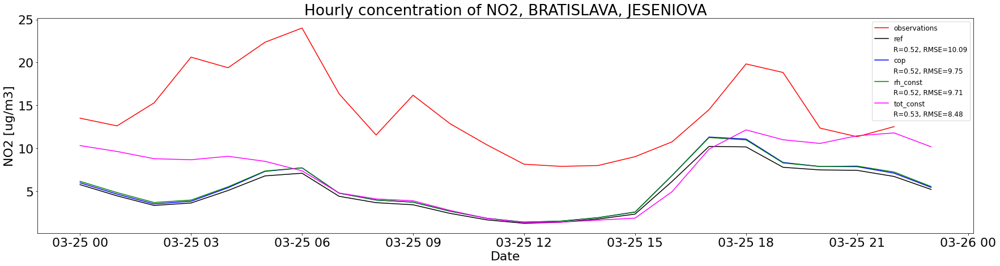

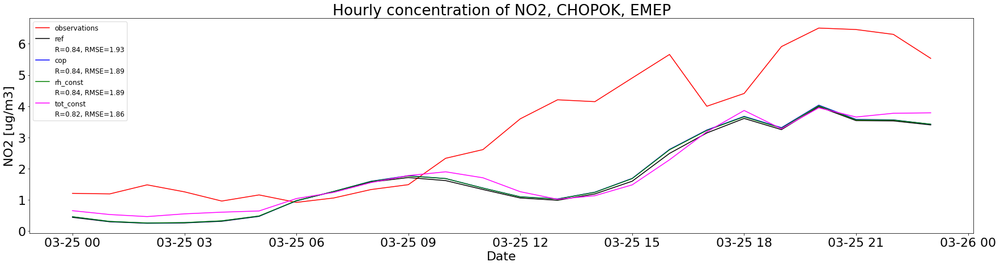

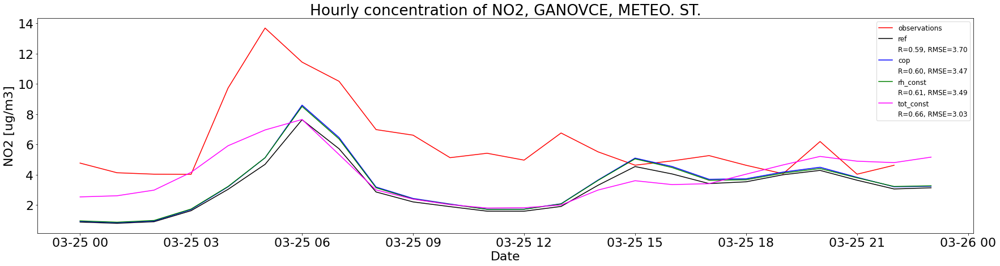

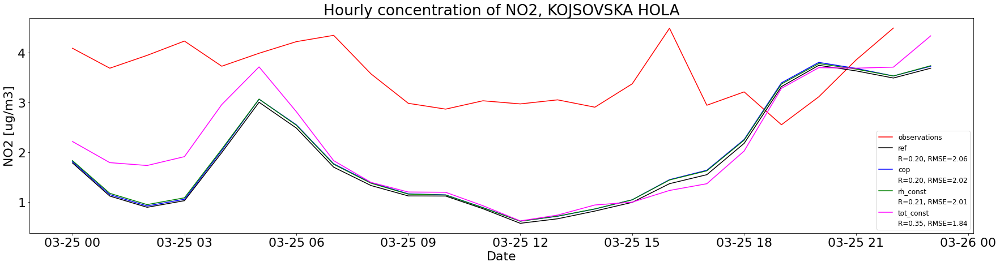

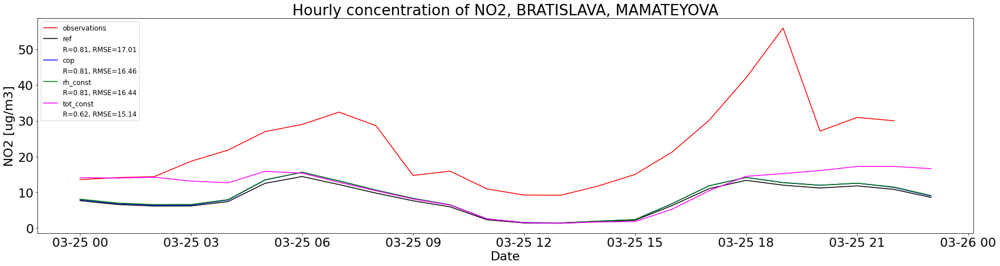

...

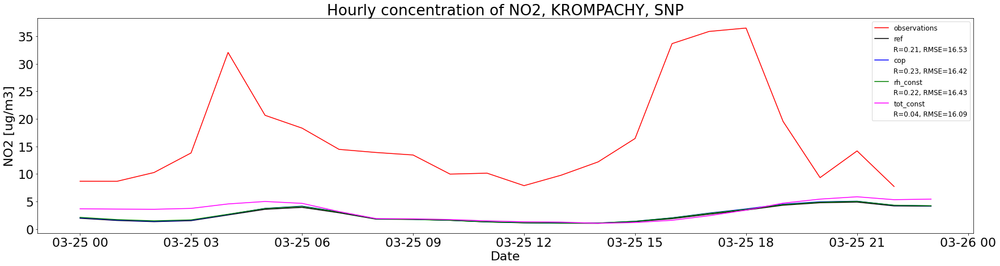

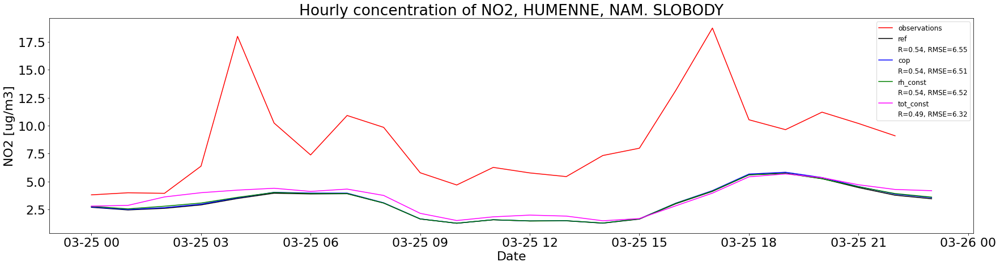

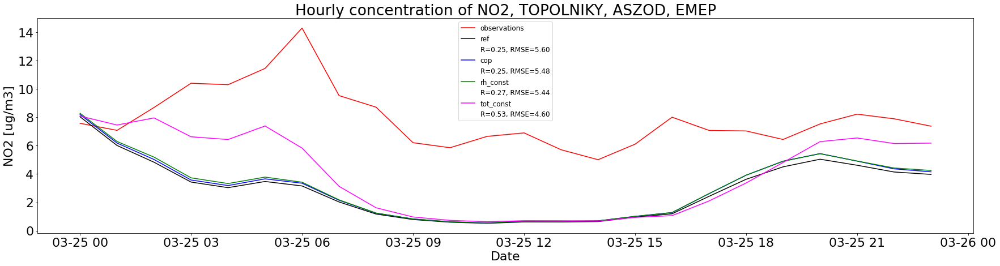

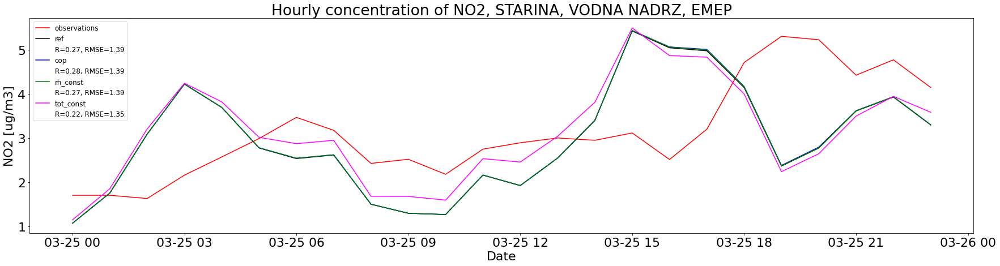

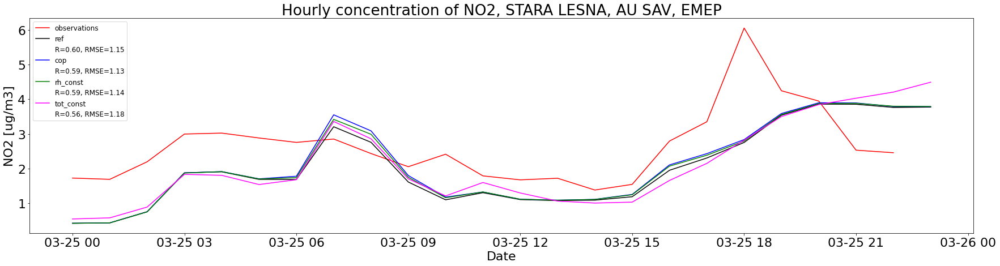

In [21]:
for i in ID:    
    
    obs_id = data[specific[0]]['OBS'].sel(station = i).to_series()[plot_from:plot_until]
    name_sta = stat[specific[0]].name.loc[stat[specific[0]].index == i].item()
    
    plt.rcParams['figure.figsize'] = 25,7
    plt.rcParams.update({'font.size': 22})

    plt.plot(obs_id.index[:], obs_id[:], color =obs_color, label = 'observations')                
    for s in specific:
        mod_id = data[s]['MOD'].sel(station = i).to_series()[plot_from:plot_until]
        
        stat_corr = mod_id.corr(obs_id)
        stat_diff = np.array((mod_id - obs_id).dropna())
        if len(stat_diff) != 0:
            stat_rmse = np.sqrt(np.sum(stat_diff**2)/len(stat_diff))
        else:
            stat_rmse = np.nan
            
        plt.plot(obs_id.index[:], mod_id[:], color = color_list[s], label = '{}'.format(s))
        plt.plot([], [], ' ', label='R={:0.2f}, RMSE={:1.2f}'.format(stat_corr,stat_rmse))

    plt.legend(fontsize=12)                
    plt.title('Hourly concentration of {0}, {1}'.format(v,name_sta))                               
    plt.xlabel('Hours')
    plt.ylabel('{0} [{1}]'.format(v,units))
    plt.tight_layout()

    if save:
        plt.savefig('{0}/HC_{1}_{2}_{3}_{4}to{5}.png'.format(graphs_path,nick,v,i,plot_from,plot_until[5:]), dpi=300)
    
    plt.show()                
    plt.close()   

## Mean diurnal profile for stations

Mean diurnal profile is computed by averaging the concentrations for each hour of the day, for selected stations, for the whole selected period. 


In [17]:
### USER INPUT
# Choose stations to plot
ID = list(stat_all.loc[stat_all.coverage != 0].index.values)[1:]   # all stations with non-zero coverage
#ID = [11813,11916]    # selected stations

my_season = 'winter'

save = False   # save the plots?  the saved files start with MDP - Mean Diurnal Profile

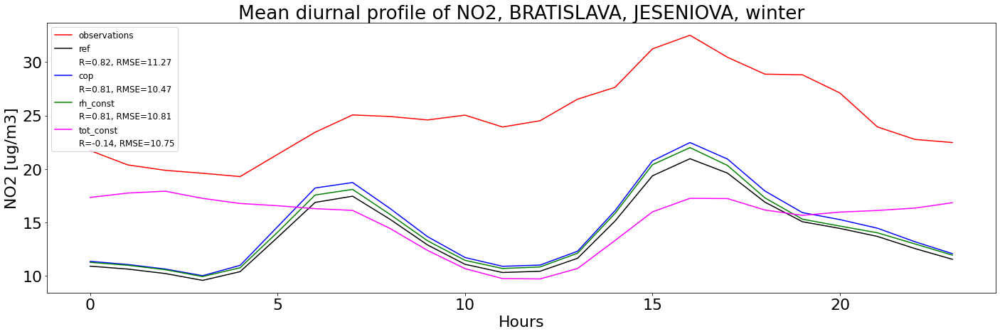

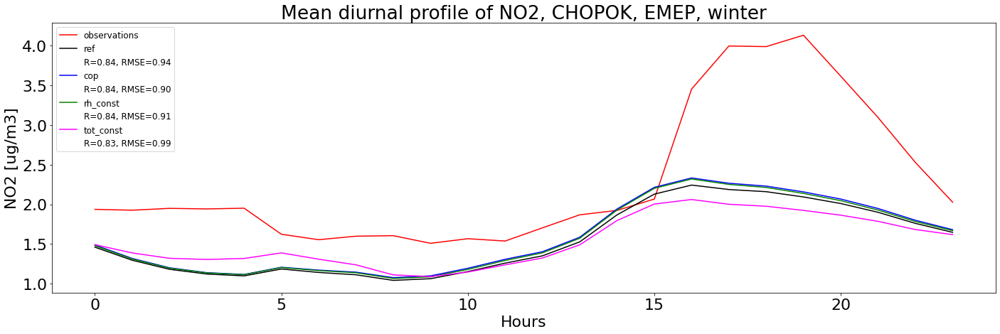

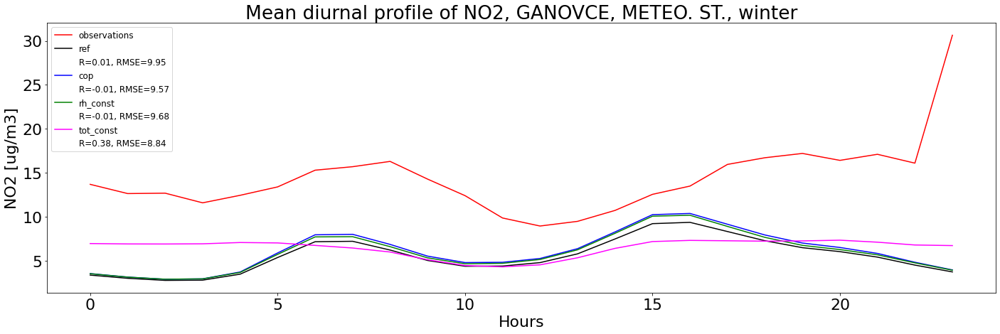

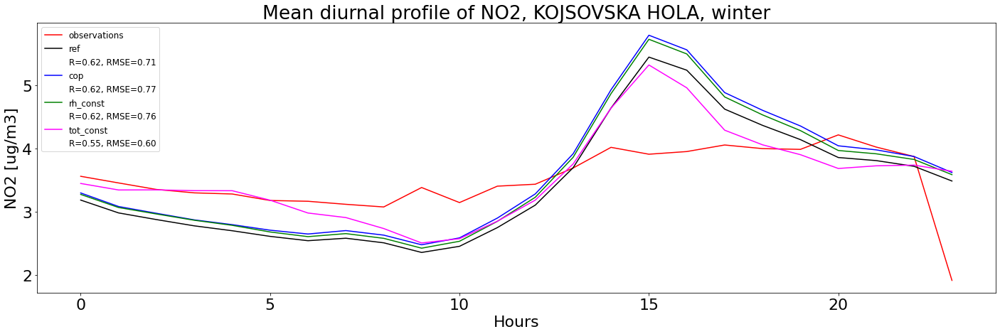

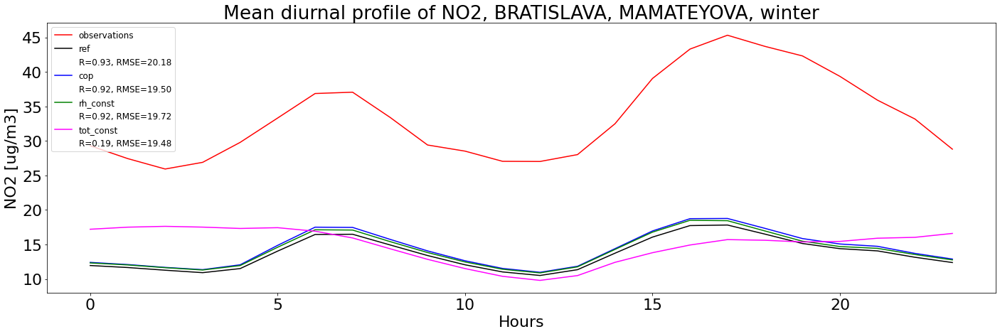

...

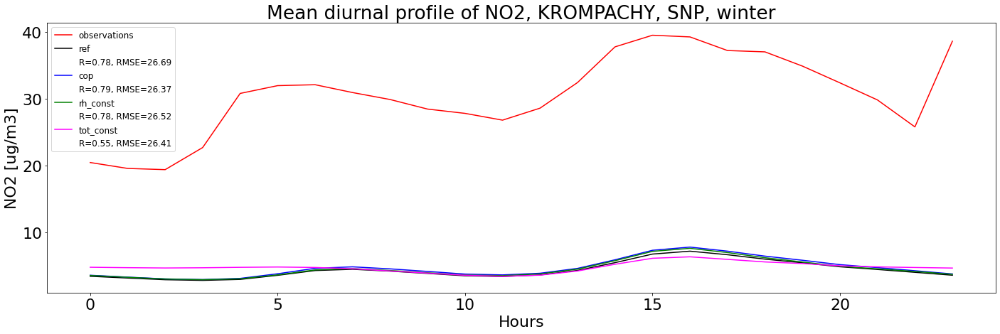

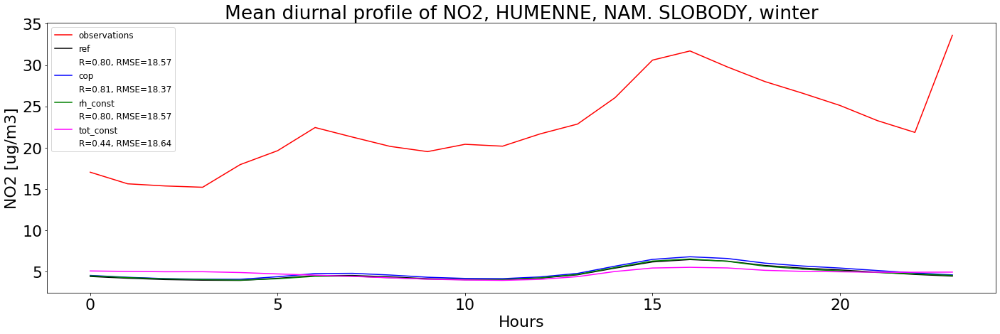

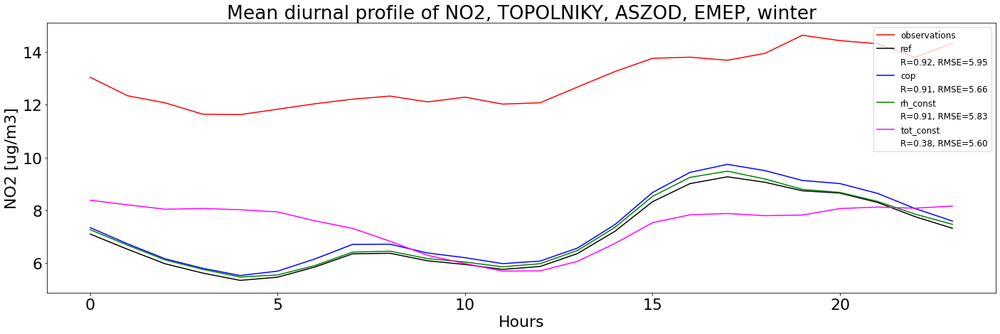

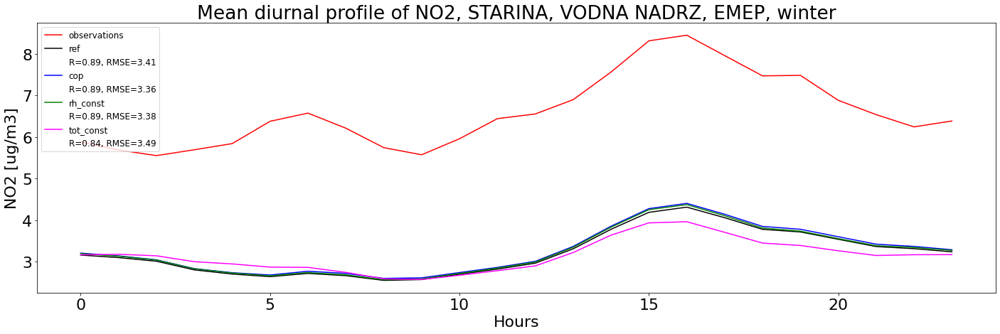

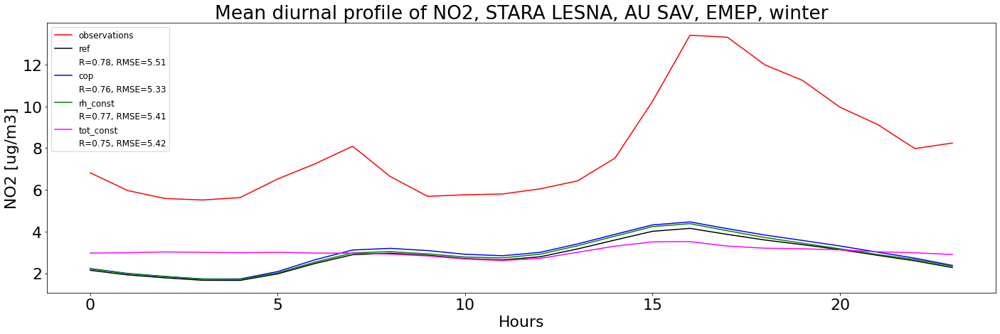

In [18]:
for i in ID:    
    
    obs_id = data[specific[0]]['OBS'].sel(station = i, time = data[specific[0]].time.dt.month.isin(season_months[my_season])).groupby('time.hour').mean()
    name_sta = stat[specific[0]].name.loc[stat[specific[0]].index == i].item()
    
    plt.rcParams['figure.figsize'] = 20,7
    plt.rcParams.update({'font.size': 22})

    plt.plot(obs_id.hour, obs_id[:], color =obs_color, label = 'observations')                
    for s in specific:
        mod_id = data[s]['MOD'].sel(station = i, time = data[s].time.dt.month.isin(season_months[my_season])).groupby('time.hour').mean()
        
        stat_corr = mod_id.to_series().corr(obs_id.to_series())
        stat_diff = np.array((mod_id - obs_id).to_series().dropna())
        if len(stat_diff) != 0:
            stat_rmse = np.sqrt(np.sum(stat_diff**2)/len(stat_diff))
        else:
            stat_rmse = np.nan
            
        plt.plot(obs_id.hour, mod_id[:], color = color_list[s], label = '{}'.format(s))
        plt.plot([], [], ' ', label='R={:0.2f}, RMSE={:1.2f}'.format(stat_corr,stat_rmse))

    plt.legend(fontsize=12)                
    plt.title('Mean diurnal profile of {0} concentrations, {1}, {2}'.format(v,name_sta,my_season))                               
    plt.xlabel('Hours')
    plt.ylabel('{0} [{1}]'.format(v,units))
    plt.tight_layout()

    if save:
        plt.savefig('{0}/MDP_{1}_{2}_{3}_{4}.png'.format(graphs_path,nick,v,i,my_season), dpi=300)
    plt.show()                
    plt.close() 

## Mean diurnal profile for station types

In [22]:
### USER INPUT
# Choose station type. 

# When both station type and station location are specified, use the following:
#my_type = 'B'
#my_location = 'R'
#my_name = my_location + my_type
#ID = list(stat_all.loc[stat_all['type'] == my_type].loc[stat_all['loc'] != my_location].loc[stat_all.coverage != 0].index.values)

# When only station type is specified:
#my_name = 'B'
#ID = list(stat_all.loc[stat_all['type'] == my_name].loc[stat_all.coverage != 0].index.values)

# When only station location is specified:
#my_name = 'R'
#ID = list(stat_all.loc[stat_all['loc'] == my_name].loc[stat_all.coverage != 0].index.values)

# All stations
my_name = 'all'
ID = list(stat_all.loc[stat_all.coverage != 0].index.values)[1:]

my_season = 'winter'

save = False   # save the plots?   the saved files start with MDP - Mean Diurnal Profile

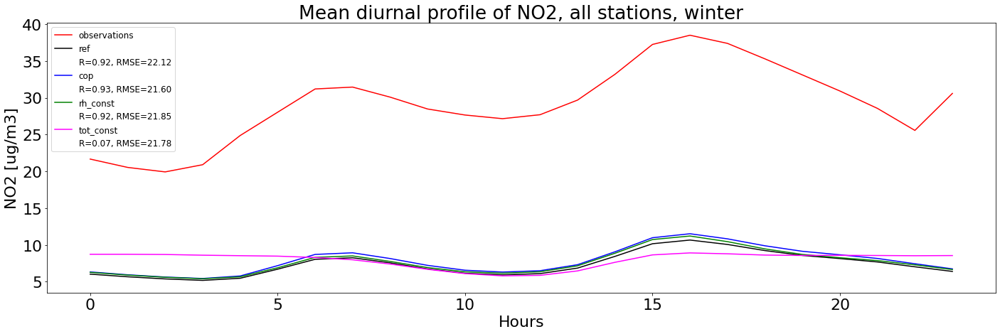

In [23]:
obs_id = data[specific[0]]['OBS'].sel(station = ID, time = data[specific[0]].time.dt.month.isin(season_months[my_season])).groupby('time.hour').mean().mean(dim = 'station')


plt.rcParams['figure.figsize'] = 20,7
plt.rcParams.update({'font.size': 22})

plt.plot(obs_id.hour, obs_id[:], color =obs_color, label = 'observations')                
for s in specific:
    mod_id = data[s]['MOD'].sel(station = ID, time = data[s].time.dt.month.isin(season_months[my_season])).groupby('time.hour').mean().mean(dim = 'station')

    stat_corr = mod_id.to_series().corr(obs_id.to_series())
    stat_diff = np.array((mod_id - obs_id).to_series().dropna())
    if len(stat_diff) != 0:
        stat_rmse = np.sqrt(np.sum(stat_diff**2)/len(stat_diff))
    else:
        stat_rmse = np.nan

    plt.plot(obs_id.hour, mod_id[:], color = color_list[s], label = '{}'.format(s))
    plt.plot([], [], ' ', label='R={:0.2f}, RMSE={:1.2f}'.format(stat_corr,stat_rmse))

plt.legend(fontsize=12)                
plt.title('Mean diurnal profile of {0} concentrations, {1} stations, {2}'.format(v, my_name,my_season))                               
plt.xlabel('Hours')
plt.ylabel('{0} [{1}]'.format(v,units))
plt.tight_layout()

if save:
    plt.savefig('{0}/MDP_{1}_{2}_{3}_{4}.png'.format(graphs_path,nick,v,i,my_season), dpi=300)

plt.show()                
plt.close() 

## Normalized mean diurnal profile for station types

Normalized values of the diurnal profiles.
The normalization allows for better comparison of diurnal profiles of different simulations with observations, since the emphasis is on the diurnal variability rather than on concentration size.

The normalized values are multiplied by 24 to achieve convenient values around 1.

In [14]:
### USER INPUT
# Choose station type. 

# When both station type and station location are specified, use the following:
#my_type = 'B'
#my_location = 'R'
#my_name = my_location + my_type
#ID = list(stat_all.loc[stat_all['type'] == my_type].loc[stat_all['loc'] != my_location].loc[stat_all.coverage != 0].index.values)

# When only station type is specified:
#my_name = 'B'
#ID = list(stat_all.loc[stat_all['type'] == my_name].loc[stat_all.coverage != 0].index.values)

# When only station location is specified:
#my_name = 'R'
#ID = list(stat_all.loc[stat_all['loc'] == my_name].loc[stat_all.coverage != 0].index.values)

# All stations
my_name = 'all'
ID = list(stat_all.loc[stat_all.coverage != 0].index.values)[1:]

my_season = 'winter'

save = False   # save the plots?   the saved files start with MDP - Mean Diurnal Profile

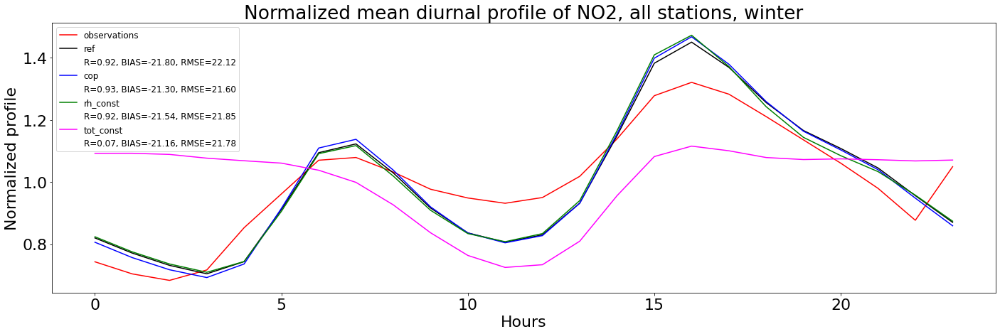

In [15]:
if save:
    print('Plots will be saved at:{}'.format(save_path))
    
obs_id = data[specific[0]]['OBS'].sel(station = ID, time = data[specific[0]].time.dt.month.isin(season_months[my_season])).groupby('time.hour').mean().mean(dim = 'station')

plt.rcParams['figure.figsize'] = 20,7
plt.rcParams.update({'font.size': 22})

obs_id_norm = 24*obs_id/obs_id.sum()
plt.plot(obs_id.hour, obs_id_norm[:], color =obs_color, label = 'observations')                
for s in specific:
    mod_id = data[s]['MOD'].sel(station = ID, time = data[s].time.dt.month.isin(season_months[my_season])).groupby('time.hour').mean().mean(dim = 'station')
    mod_id_norm = 24*mod_id/mod_id.sum()
    
    stat_corr = mod_id.to_series().corr(obs_id.to_series())
    stat_diff = np.array((mod_id - obs_id).to_series().dropna())
    if len(stat_diff) != 0:
        stat_bias = np.sum(stat_diff)/len(stat_diff)
        stat_rmse = np.sqrt(np.sum(stat_diff**2)/len(stat_diff))
    else:
        stat_rmse = np.nan
        stat_bias = np.nan
    
    plt.plot(obs_id.hour, mod_id_norm[:], color = color_list[s], label = '{}'.format(s))
    plt.plot([], [], ' ', label='R={:0.2f}, BIAS={:1.2f}, RMSE={:1.2f}'.format(stat_corr,stat_bias, stat_rmse))

plt.legend(fontsize=12)                
plt.title('Normalized mean diurnal profile of {0} concentrations, {1} stations, {2}'.format(v, my_name, my_season))                               
plt.xlabel('Hours')
plt.ylabel('Normalized profile')
plt.tight_layout()

if save:
    plt.savefig('{0}/NMDP_{1}_{2}_{3}_{4}.png'.format(graphs_path,nick,v,i,my_season), dpi=300)     
    
plt.show()                
plt.close() 

## Scaled mean diurnal profile for station types

Mean diurnal profile scaled from 0 to 1.

In [19]:
### USER INPUT
# Choose station type. 

# When both station type and station location are specified, use the following:
#my_type = 'B'
#my_location = 'R'
#my_name = my_location + my_type
#ID = list(stat_all.loc[stat_all['type'] == my_type].loc[stat_all['loc'] != my_location].loc[stat_all.coverage != 0].index.values)

# When only station type is specified:
#my_name = 'B'
#ID = list(stat_all.loc[stat_all['type'] == my_name].loc[stat_all.coverage != 0].index.values)

# When only station location is specified:
#my_name = 'R'
#ID = list(stat_all.loc[stat_all['loc'] == my_name].loc[stat_all.coverage != 0].index.values)

# All stations
my_name = 'all'
ID = list(stat_all.loc[stat_all.coverage != 0].index.values)[1:]

my_season = 'winter'

save = False   # save the plots?   the saved files start with MDP - Mean Diurnal Profile

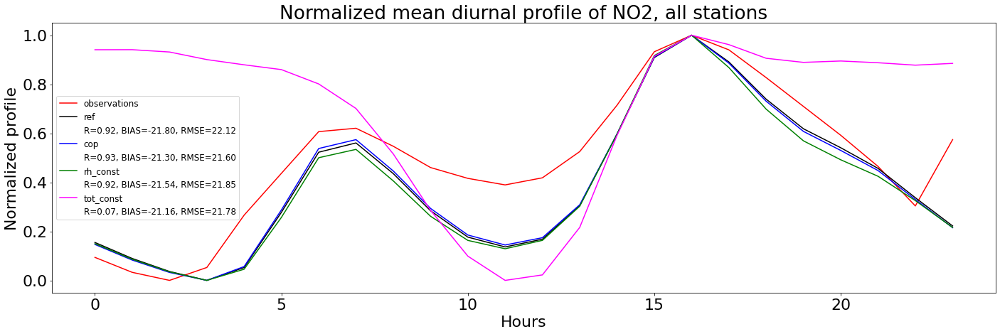

In [20]:
if save:
    print('Plots will be saved at:{}'.format(save_path))
    
obs_id = data[specific[0]]['OBS'].sel(station = ID, time = data[specific[0]].time.dt.month.isin(season_months[my_season])).groupby('time.hour').mean().mean(dim = 'station')

plt.rcParams['figure.figsize'] = 20,7
plt.rcParams.update({'font.size': 22})

obs_max = obs_id.max().item()
obs_min = obs_id.min().item()
obs_id_scaled = (obs_id - obs_min)/(obs_max-obs_min)
plt.plot(obs_id.hour, obs_id_scaled[:], color =obs_color, label = 'observations')     

for s in specific:
    mod_id = data[s]['MOD'].sel(station = ID, time = data[s].time.dt.month.isin(season_months[my_season])).groupby('time.hour').mean().mean(dim = 'station')
    mod_max = mod_id.max().item()
    mod_min = mod_id.min().item()
    mod_id_scaled = (mod_id - mod_min)/(mod_max-mod_min)
    
    stat_corr = mod_id.to_series().corr(obs_id.to_series())
    stat_diff = np.array((mod_id - obs_id).to_series().dropna())
    if len(stat_diff) != 0:
        stat_bias = np.sum(stat_diff)/len(stat_diff)
        stat_rmse = np.sqrt(np.sum(stat_diff**2)/len(stat_diff))
    else:
        stat_rmse = np.nan
        stat_bias = np.nan
    
    plt.plot(obs_id.hour, mod_id_scaled[:], color = color_list[s], label = '{}'.format(s))
    plt.plot([], [], ' ', label='R={:0.2f}, BIAS={:1.2f}, RMSE={:1.2f}'.format(stat_corr,stat_bias, stat_rmse))

plt.legend(fontsize=12)                
plt.title('Scaled mean diurnal profile of {0} concentrations, {1} stations'.format(v, my_name))                               
plt.xlabel('Hours')
plt.ylabel('Normalized profile')
plt.tight_layout()

if save:
    plt.savefig('{0}/SMDP_{1}_{2}_{3}_{4}.png'.format(graphs_path,nick,v,i,my_season), dpi=300)     
    
plt.show()                
plt.close() 

## Daily averages for stations

Daily averages of concentrations for specific stations, for a selected period.

In [24]:
### USER INPUT
# Choose stations to plot
ID = list(stat_all.loc[stat_all.coverage != 0].index.values)[1:]   # all stations with non-zero coverages
#ID = [11813,11916]    # selected stations
save = False   # save the plots?

plot_from = '2017-01-01'
plot_until = '2017-12-31' 

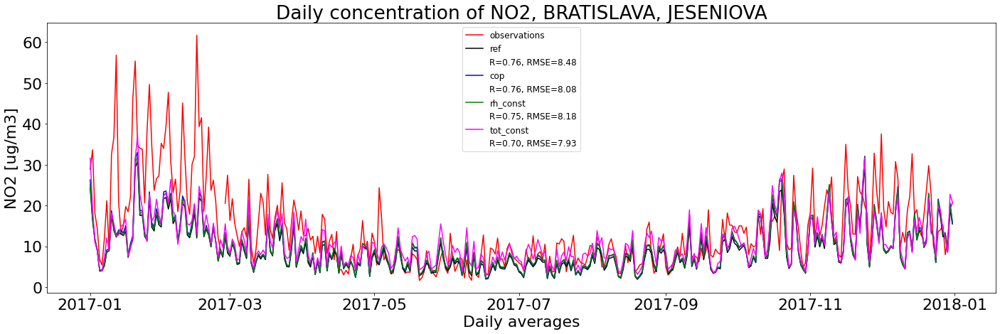

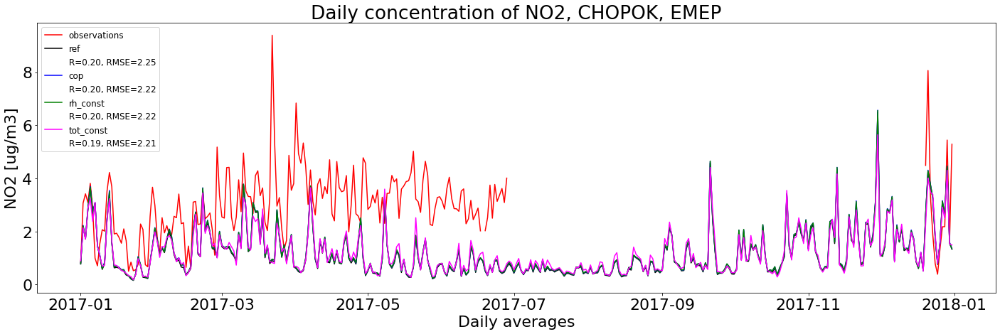

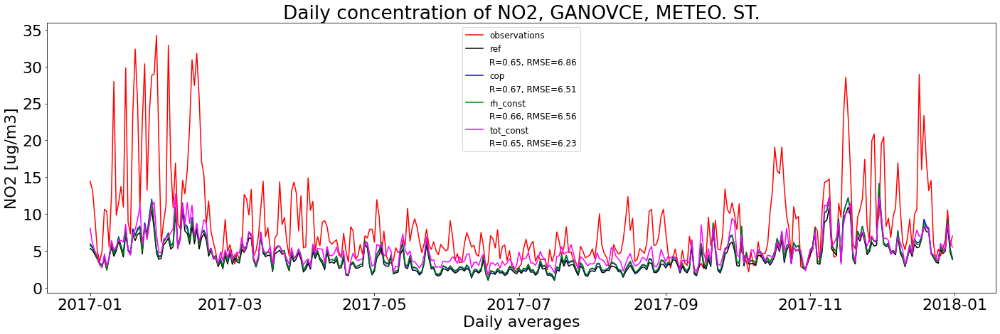

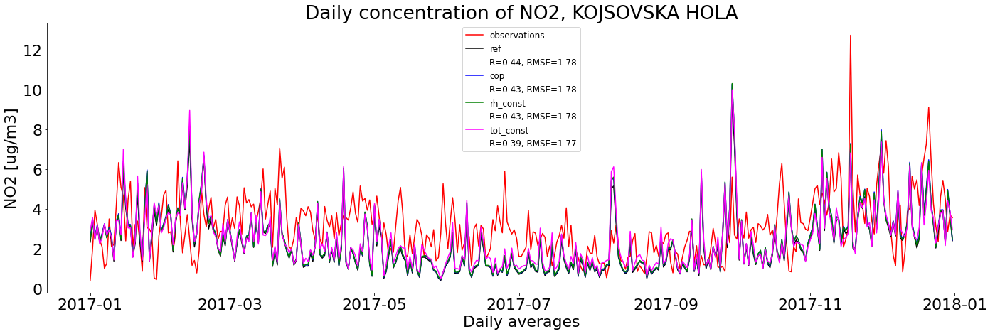

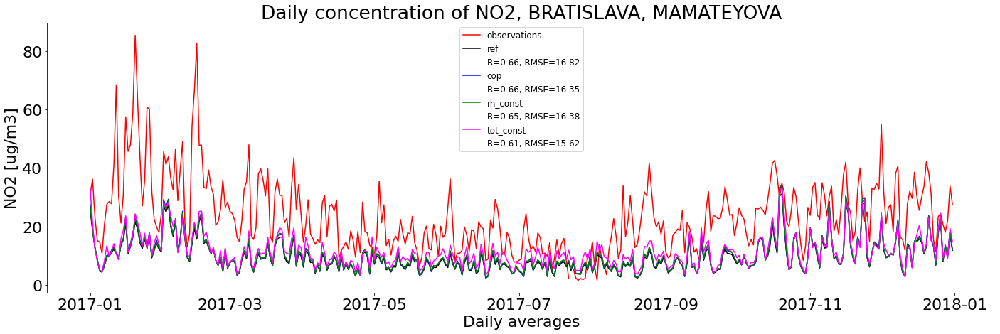

...

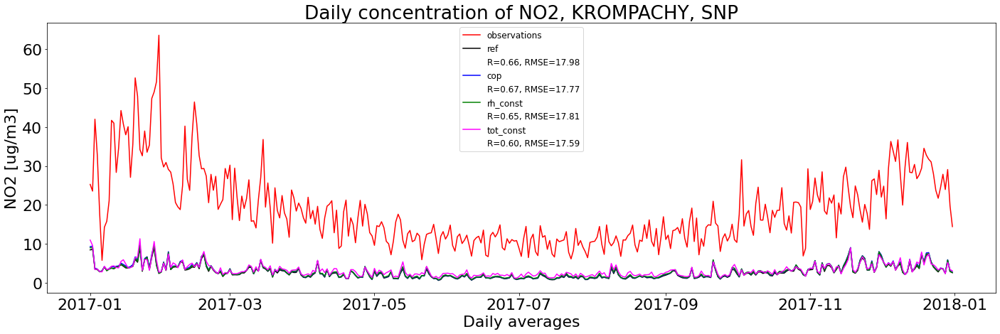

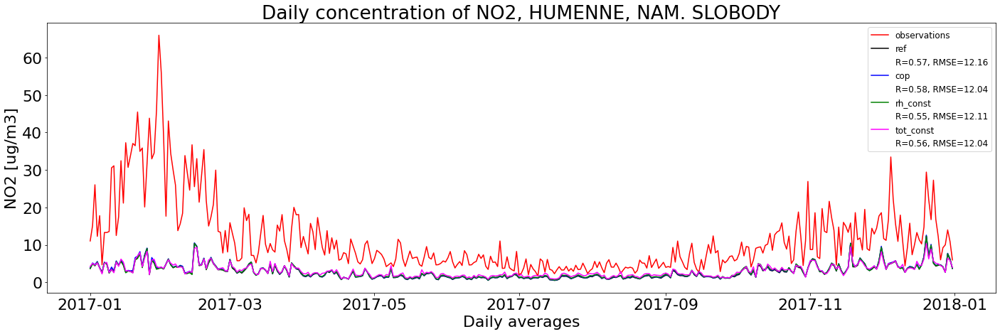

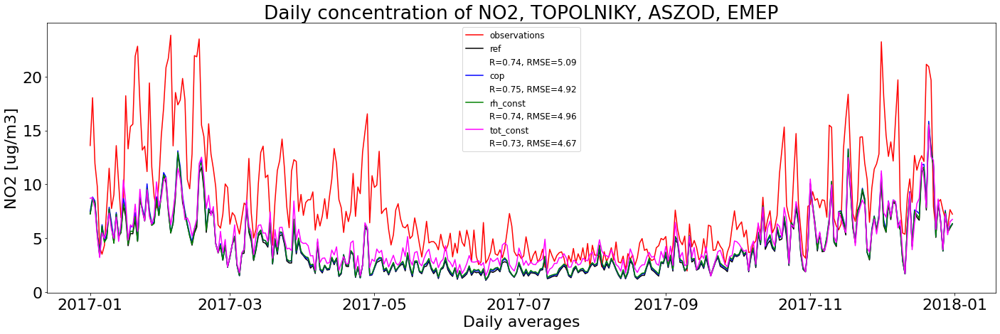

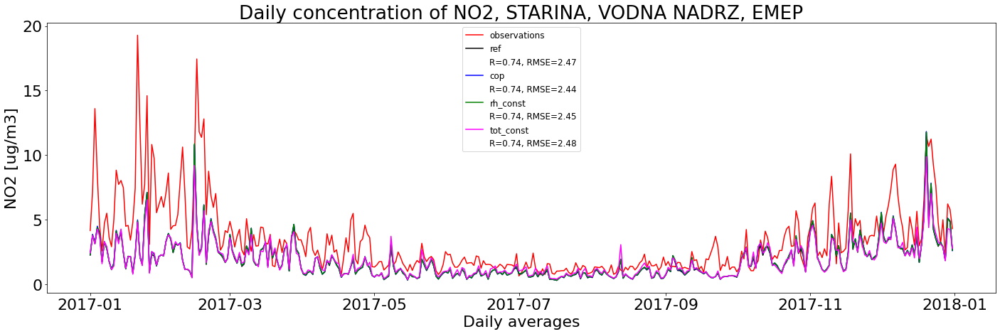

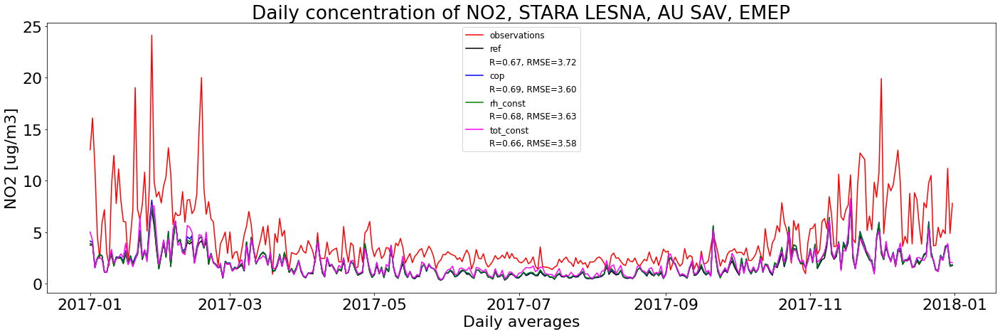

In [25]:
if save:
    print('Plots will be saved at:{}'.format(save_path))
for i in ID:
    obs_id = data[specific[0]]['OBS'].sel(station = i).to_series()[plot_from:plot_until]
    name_sta = stat[specific[0]].name.loc[stat[specific[0]].index == i].item()
    daily_obs = obs_id.groupby(pd.Grouper(freq='D')).mean()
    
    plt.rcParams['figure.figsize'] = 20,7
    plt.rcParams.update({'font.size': 22})
    plt.plot(daily_obs.index[:], daily_obs[:], color = obs_color, label = 'observations')                
    
    for s in specific:        
        mod_id = data[s]['MOD'].sel(station = i).to_series()[plot_from:plot_until]        
        daily_mod = mod_id.groupby(pd.Grouper(freq='D')).mean()

        stat_corr_daily = daily_mod.corr(daily_obs)
        stat_diff_daily = np.array((daily_mod - daily_obs).dropna())
        if len(stat_diff_daily) != 0:
            stat_rmse_daily = np.sqrt(np.sum(stat_diff_daily**2)/len(stat_diff_daily))
        else:
            stat_rmse_daily = np.nan

        plt.plot(daily_obs.index[:], daily_mod[:], color = color_list[s], label = '{}'.format(s))
        plt.plot([], [], ' ', label='R={:0.2f}, RMSE={:1.2f}'.format(stat_corr_daily,stat_rmse_daily))

    plt.legend(fontsize=12)                
    plt.title('Average daily concentration of {0}, {1}'.format(v,name_sta))                               
    plt.xlabel('Daily averages')
    plt.ylabel('{0} [{1}]'.format(v,units))
    plt.tight_layout()

    if save:
        plt.savefig('{0}/DA_{1}_{2}_{3}_{4}to{5}.png'.format(graphs_path,nick,v,i,plot_from,plot_until[5:]), dpi=300)
        
    plt.show()                
    plt.close()   

## Daily averages for station types, whole year

Daily averages for station types, for a whole year.

In [28]:
### USER INPUT
# Choose station type. 

# When both station type and station location are specified, use the following:
#my_type = 'B'
#my_location = 'R'
#my_name = my_location + my_type
#ID = list(stat_all.loc[stat_all['type'] == my_type].loc[stat_all['loc'] != my_location].loc[stat_all.coverage != 0].index.values)

# When only station type is specified:
#my_name = 'B'
#ID = list(stat_all.loc[stat_all['type'] == my_name].loc[stat_all.coverage != 0].index.values)

# When only station location is specified:
#my_name = 'R'
#ID = list(stat_all.loc[stat_all['loc'] == my_name].loc[stat_all.coverage != 0].index.values)

# All stations
my_name = 'all'
ID = list(stat_all.loc[stat_all.coverage != 0].index.values)[1:]

save = False   # save the plots?   the saved files start with MDP - Mean Diurnal Profile

/data/juraj/anaconda/envs/supergeo/lib/python3.8/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)


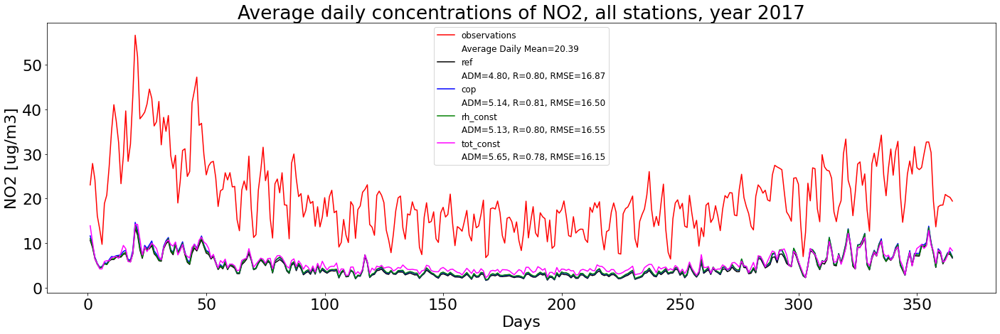

In [31]:
if save:
    print('Plots will be saved at:{}'.format(save_path))
#for i in ID:    
days_np = np.repeat(np.linspace(1,365,365),24)
new_data = data[specific[0]].assign_coords(time = days_np)    
obs_id = new_data['OBS'].sel(station = ID).groupby(new_data['OBS'].time).mean().mean(dim = 'station')
obs_mean = obs_id.mean()

plt.rcParams['figure.figsize'] = 20,7
plt.rcParams.update({'font.size': 22})

plt.plot(obs_id.time, obs_id[:], color =obs_color, label = 'observations') 
plt.plot([], [], ' ', label='Average Daily Mean={:0.2f}'.format(obs_mean.item()))

for s in specific:
    new_data = data[s].assign_coords(time = days_np)
    mod_id = new_data['MOD'].sel(station = ID).groupby(new_data['MOD'].time).mean().mean(dim = 'station')
    mod_mean = mod_id.mean()

    stat_corr = mod_id.to_series().corr(obs_id.to_series())
    stat_diff = np.array((mod_id - obs_id).to_series().dropna())
    if len(stat_diff) != 0:
        stat_rmse = np.sqrt(np.sum(stat_diff**2)/len(stat_diff))
    else:
        stat_rmse = np.nan

    plt.plot(obs_id.time, mod_id[:], color = color_list[s], label = '{}'.format(s))
    plt.plot([], [], ' ', label='ADM={:0.2f}, R={:1.2f}, RMSE={:1.2f}'.format(mod_mean.item(),stat_corr,stat_rmse))

plt.legend(fontsize=12)                
plt.title('Average daily concentrations of {0}, {1} stations, year {2}'.format(v, my_name,plot_from[0:4]))                               
plt.xlabel('Days')
plt.ylabel('{0} [{1}]'.format(v,units))
plt.tight_layout()

if save:
        plt.savefig('{0}/DA_{1}_{2}_{3}_year{4}.png'.format(graphs_path,nick,v,i,plot_from[0:4]), dpi=300)
        
plt.show()                
plt.close() 

## Mean diurnal profiles for seasons

Mean diurnal profiles for seasons of the year. The plots are made with observations and one of the selected simulations from the whole period.

### For individual stations

In [33]:
### USER INPUT
# Choose stations to plot
ID = list(stat_all.loc[stat_all.coverage != 0].index.values)[1:]  #all stations with non-zero coverage
#ID = [11813,11916]    # selected stations
spec_nick = 'tot_const'   #simulation specific name (as defined in the first cell of the notebook in "specific" field)

save = False   # save the plots?  

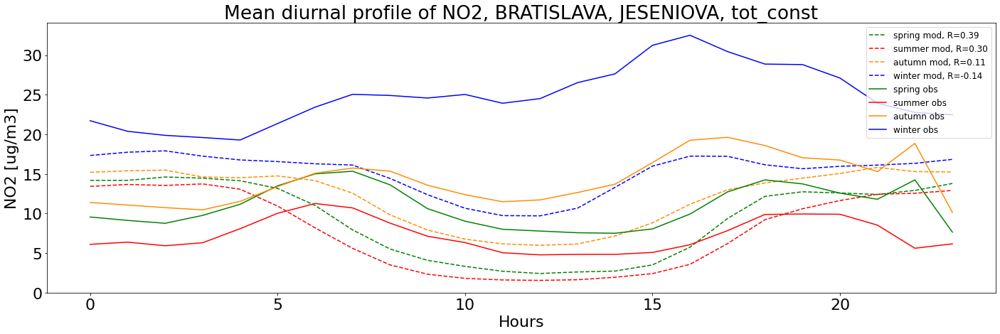

/data/juraj/anaconda/envs/supergeo/lib/python3.8/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)


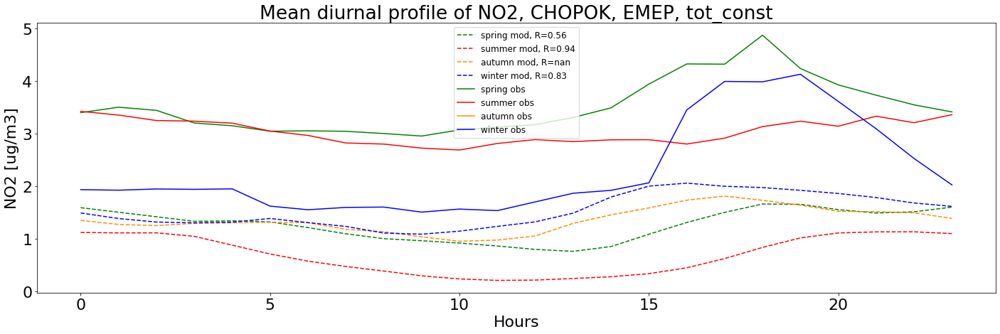

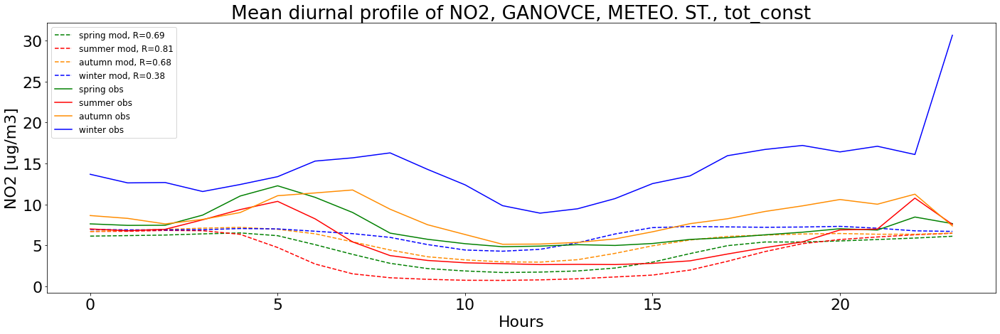

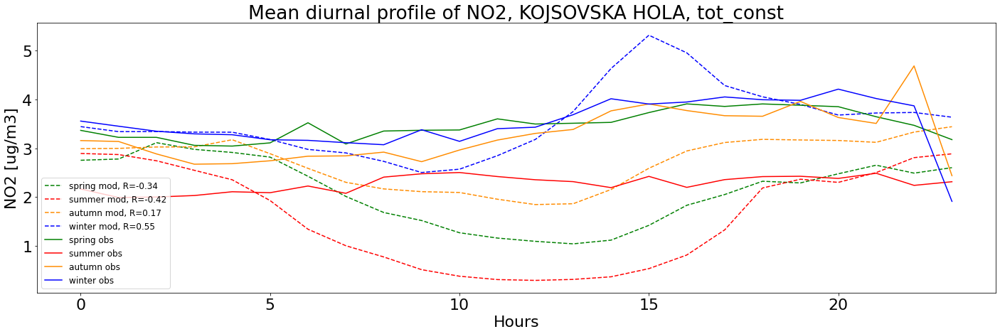

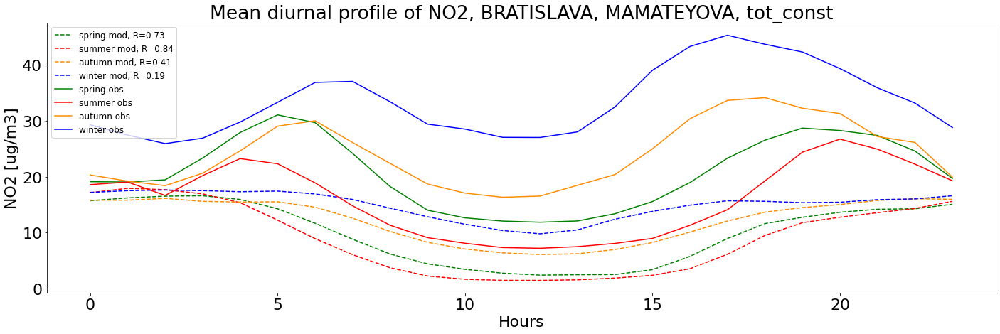

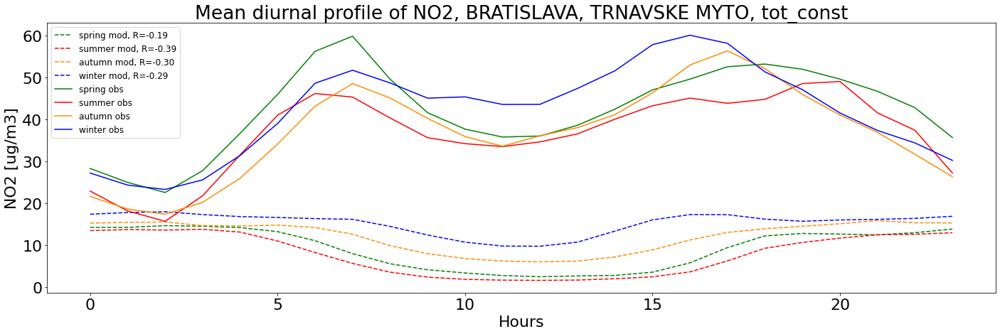

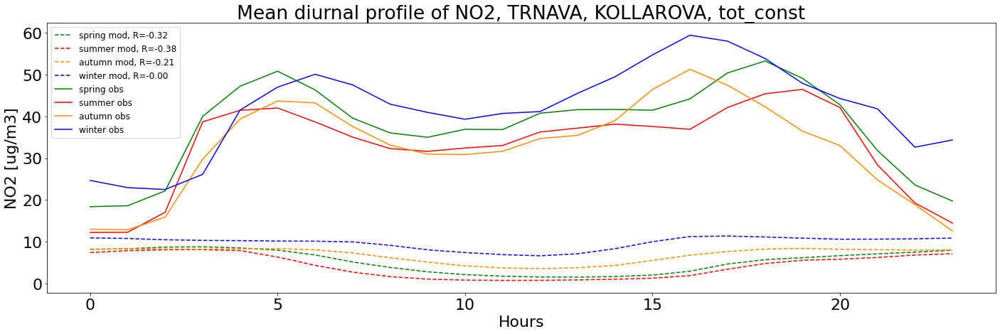

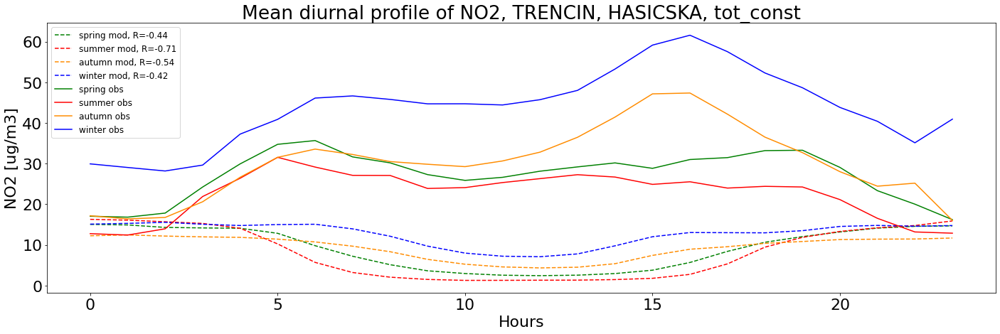

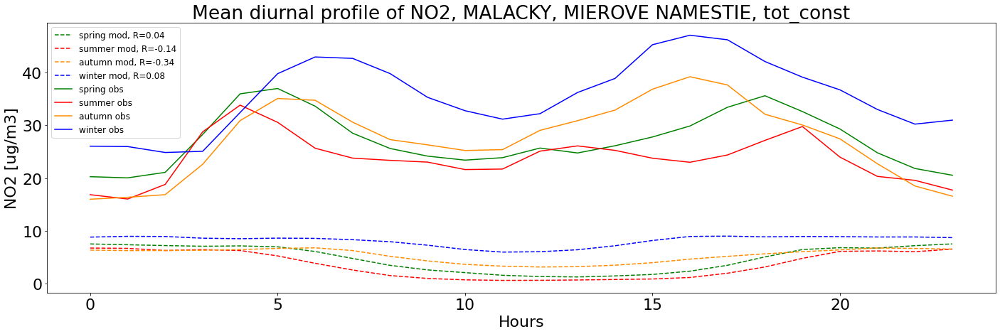

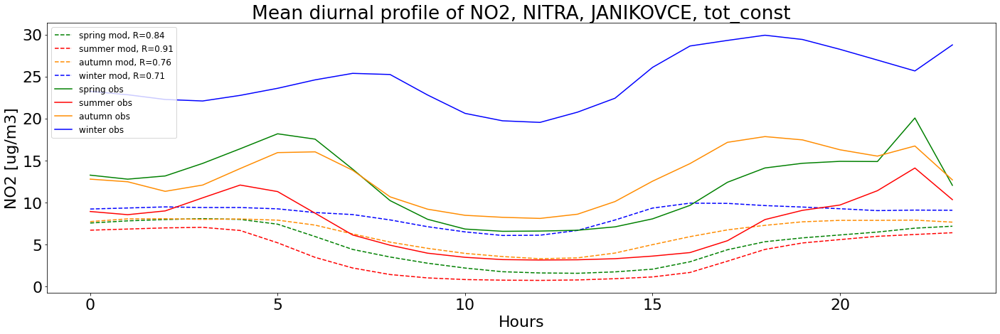

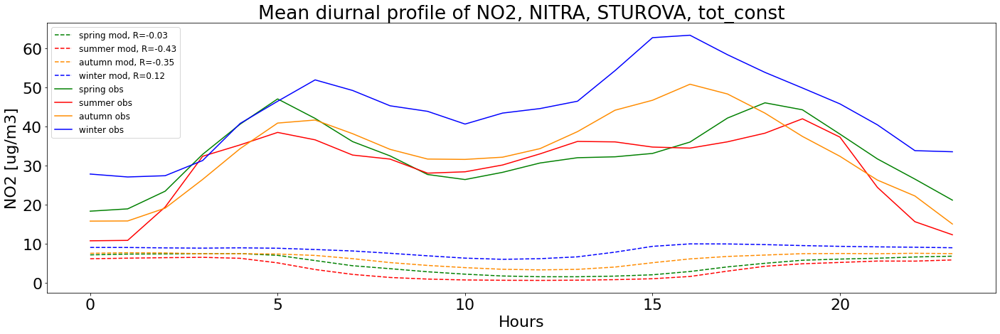

/data/juraj/anaconda/envs/supergeo/lib/python3.8/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)


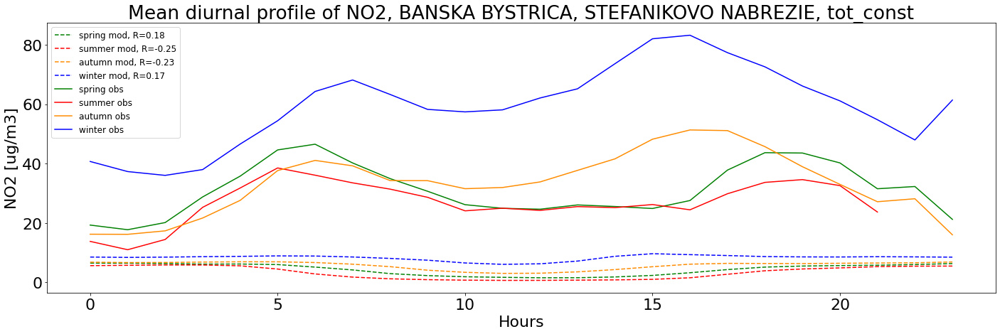

/data/juraj/anaconda/envs/supergeo/lib/python3.8/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)


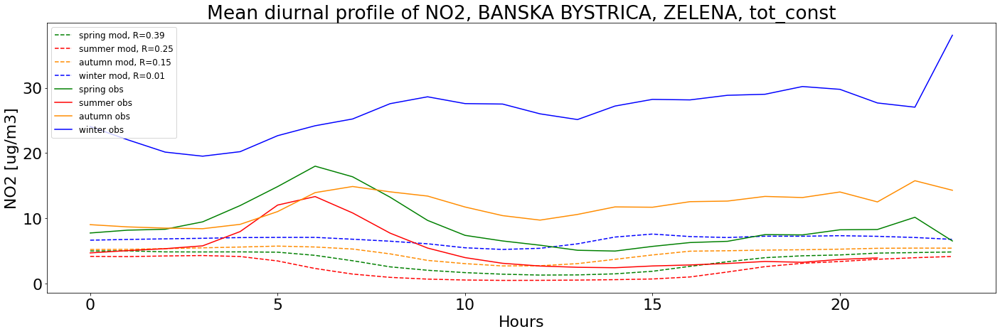

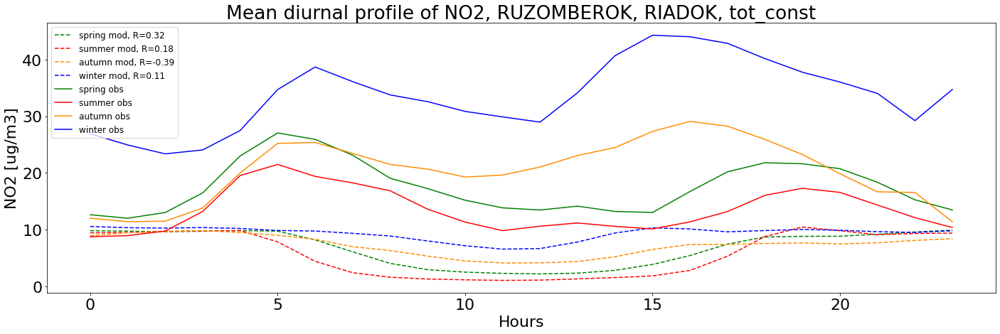

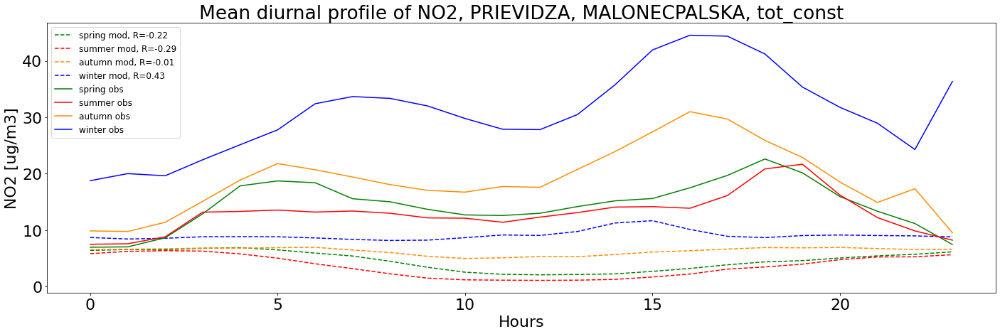

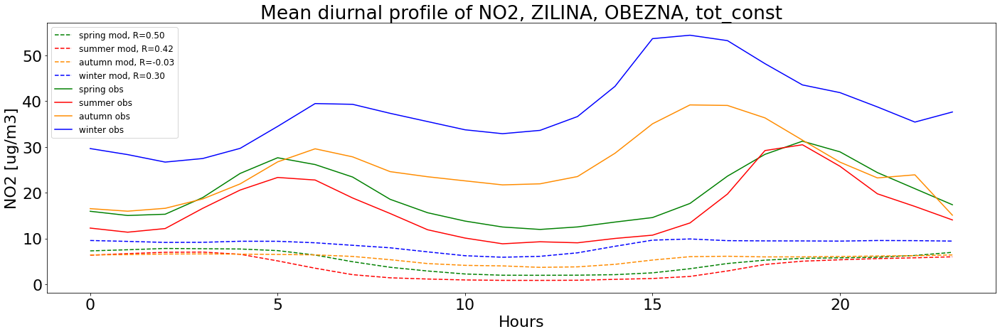

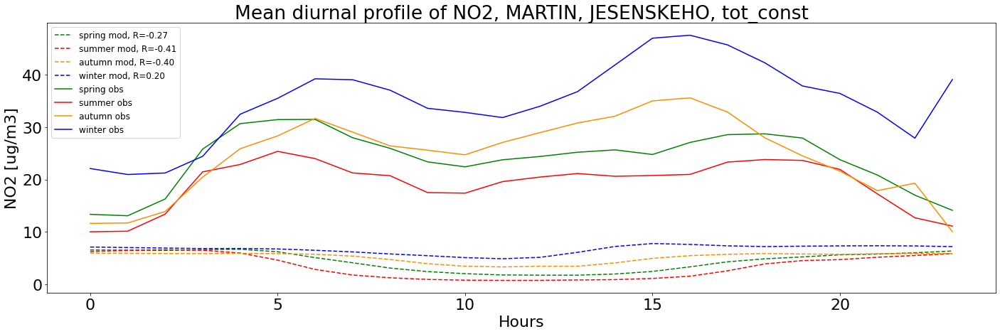

...

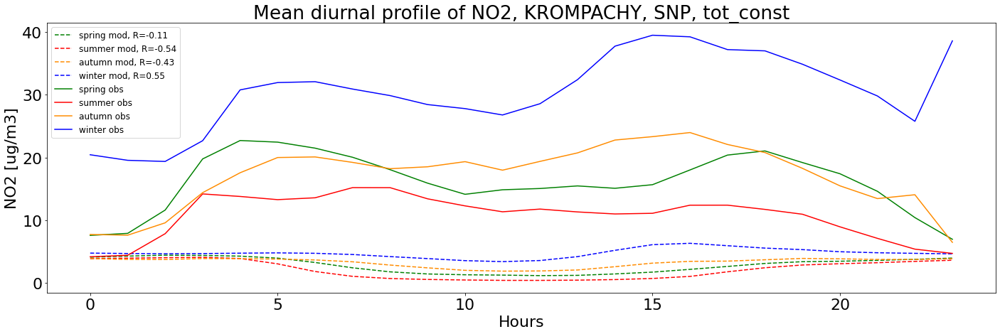

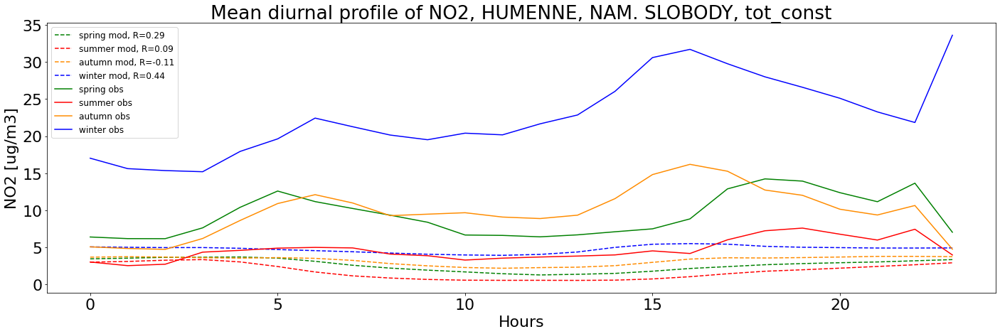

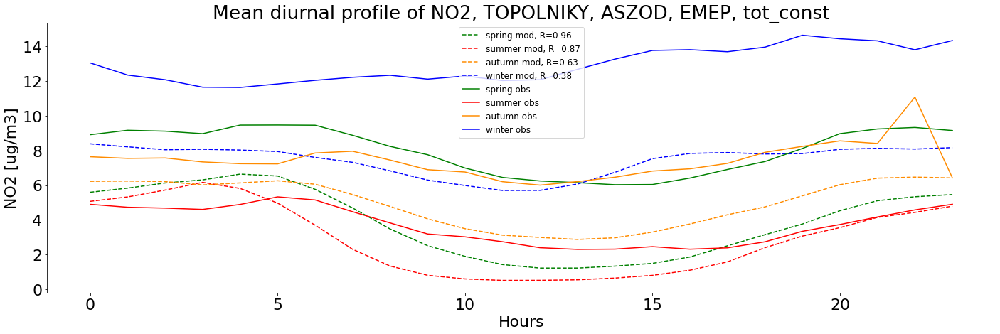

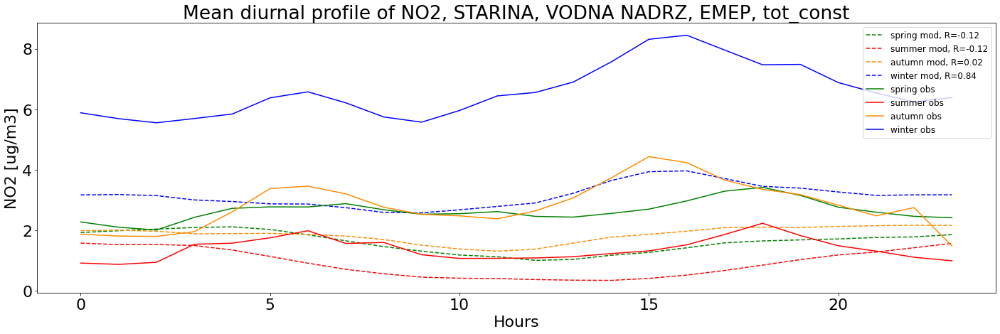

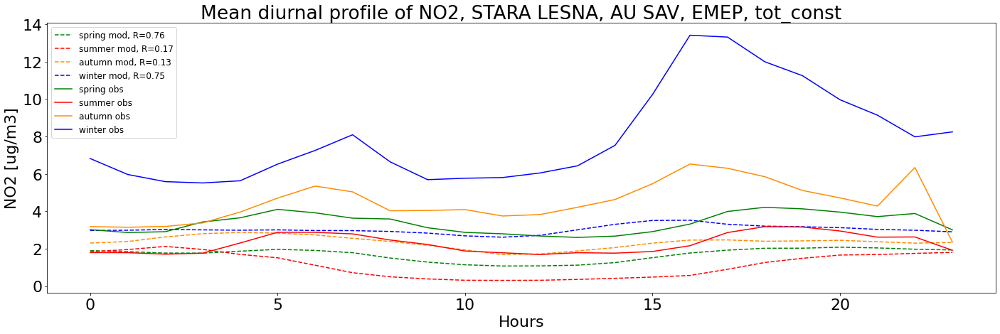

In [35]:
if save:
    print('Plots will be saved at:{}'.format(save_path))
for i in ID:    
    
    mod_id_jar = data[spec_nick]['MOD'].sel(station = i, time = data[spec_nick].time.dt.month.isin(season_months['spring'])).groupby('time.hour').mean()
    mod_id_leto = data[spec_nick]['MOD'].sel(station = i, time = data[spec_nick].time.dt.month.isin(season_months['summer'])).groupby('time.hour').mean()
    mod_id_jesen = data[spec_nick]['MOD'].sel(station = i, time = data[spec_nick].time.dt.month.isin(season_months['autumn'])).groupby('time.hour').mean()
    mod_id_zima = data[spec_nick]['MOD'].sel(station = i, time = data[spec_nick].time.dt.month.isin(season_months['winter'])).groupby('time.hour').mean()
    
    obs_id_jar = data[specific[0]]['OBS'].sel(station = i, time = data[specific[0]].time.dt.month.isin(season_months['spring'])).groupby('time.hour').mean()
    obs_id_leto = data[specific[0]]['OBS'].sel(station = i, time = data[specific[0]].time.dt.month.isin(season_months['summer'])).groupby('time.hour').mean()
    obs_id_jesen = data[specific[0]]['OBS'].sel(station = i, time = data[specific[0]].time.dt.month.isin(season_months['autumn'])).groupby('time.hour').mean()
    obs_id_zima = data[specific[0]]['OBS'].sel(station = i, time = data[specific[0]].time.dt.month.isin(season_months['winter'])).groupby('time.hour').mean()
    
    r_jar = mod_id_jar.to_series().corr(obs_id_jar.to_series())
    r_leto = mod_id_leto.to_series().corr(obs_id_leto.to_series())
    r_jesen = mod_id_jesen.to_series().corr(obs_id_jesen.to_series())
    r_zima = mod_id_zima.to_series().corr(obs_id_zima.to_series())
    
    name_sta = stat[spec_nick].name.loc[stat[spec_nick].index == i].item()
    
    plt.rcParams['figure.figsize'] = 20,7
    plt.rcParams.update({'font.size': 22})

    plt.plot(mod_id_jar.hour, mod_id_jar[:], color ='green', linestyle='--', label = 'spring mod, R={:0.2f}'.format(r_jar)) 
    plt.plot(mod_id_leto.hour, mod_id_leto[:], color ='red', linestyle='--', label = 'summer mod, R={:0.2f}'.format(r_leto))
    plt.plot(mod_id_jesen.hour, mod_id_jesen[:], color ='darkorange', linestyle='--', label = 'autumn mod, R={:0.2f}'.format(r_jesen)) 
    plt.plot(mod_id_zima.hour, mod_id_zima[:], color ='blue', linestyle='--', label = 'winter mod, R={:0.2f}'.format(r_zima))
    
    plt.plot(obs_id_jar.hour, obs_id_jar[:], color ='green', label = 'spring obs') 
    plt.plot(obs_id_leto.hour, obs_id_leto[:], color ='red', label = 'summer obs')
    plt.plot(obs_id_jesen.hour, obs_id_jesen[:], color ='darkorange', label = 'autumn obs') 
    plt.plot(obs_id_zima.hour, obs_id_zima[:], color ='blue', label = 'winter obs')
    
    plt.legend(fontsize=12)                
    plt.title('Mean diurnal profile of {0} concentrations, {1}, {2}'.format(v,name_sta,spec_nick))                               
    plt.xlabel('Hours')
    plt.ylabel('{0} [{1}]'.format(v,units))
    plt.tight_layout()

    if save:
        plt.savefig('{0}/MDPS_{1}_{2}_{3}_{4}.png'.format(graphs_path,nick,v,i,spec_nick), dpi=300)
        
    plt.show()                
    plt.close() 

### For station types

Mean diurnal profiles for station types and station locations. By default, the plots are made for each type and location individually. 

You can make plots of station type and location combinations by uncommenting the stat_types_new field, which contains rural background, other background (suburban and urban background) and urban traffic stations.
You need to uncomment the second for cycle option and the second set of conditions after the for cycle beginning, while commenting the other conditions.

The plots are made for observations with one selected simulation.

In [40]:
spec_nick = 'tot_const'   #simulation specific name (as defined in the first cell of the notebook in "specific" field)
save = False

#stat_types_new = ['RB', 'OB', 'UT']  #uncomment for combinations of station type and location

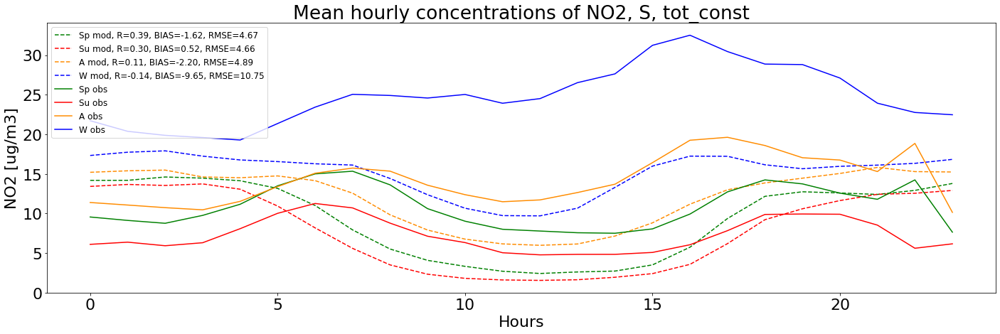

/data/juraj/anaconda/envs/supergeo/lib/python3.8/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)


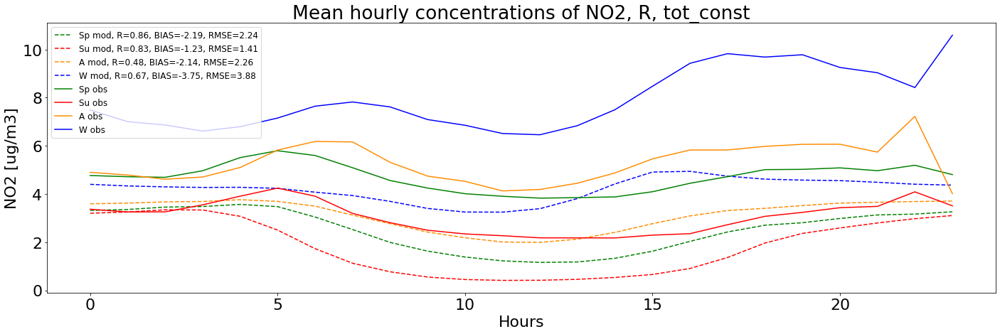

/data/juraj/anaconda/envs/supergeo/lib/python3.8/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)


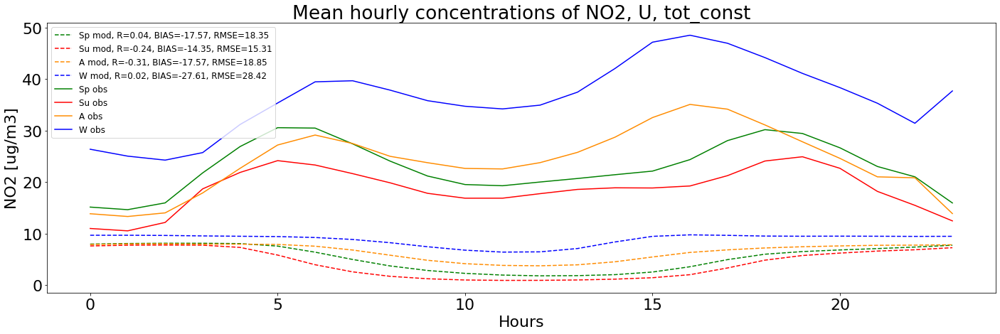

/data/juraj/anaconda/envs/supergeo/lib/python3.8/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)


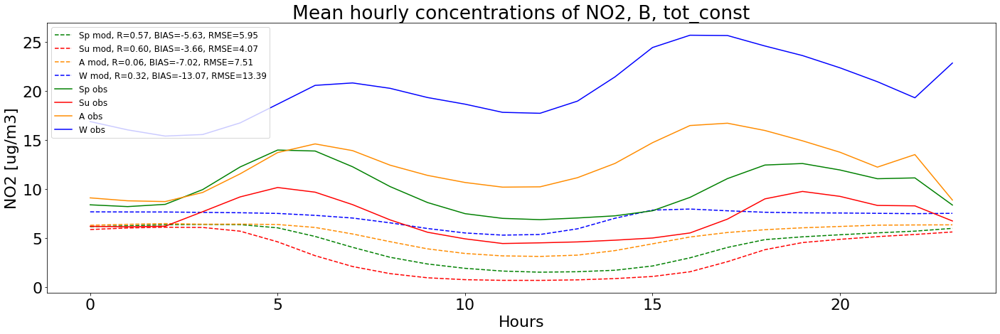

/data/juraj/anaconda/envs/supergeo/lib/python3.8/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)


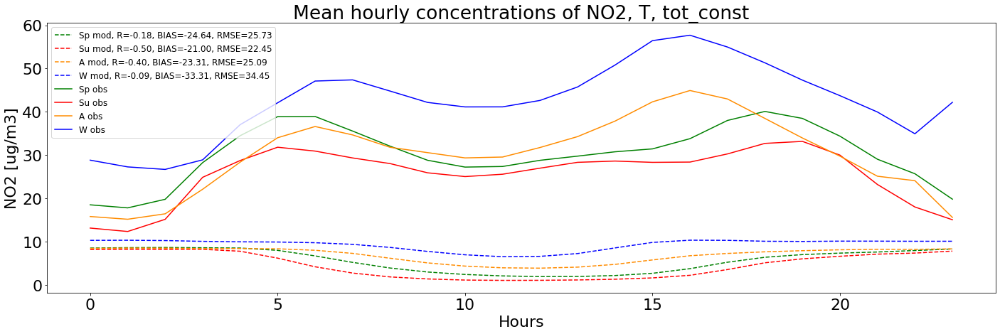

/data/juraj/anaconda/envs/supergeo/lib/python3.8/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)
<ipython-input-41-e0b8a308a5f9>:46: RuntimeWarning: invalid value encountered in double_scalars
  jar_rmse = np.sqrt(np.sum(jar_diff**2)/len(jar_diff))
<ipython-input-41-e0b8a308a5f9>:47: RuntimeWarning: invalid value encountered in double_scalars
  leto_rmse = np.sqrt(np.sum(leto_diff**2)/len(leto_diff))
<ipython-input-41-e0b8a308a5f9>:48: RuntimeWarning: invalid value encountered in double_scalars
  jesen_rmse = np.sqrt(np.sum(jesen_diff**2)/len(jesen_diff))
<ipython-input-41-e0b8a308a5f9>:49: RuntimeWarning: invalid value encountered in double_scalars
  zima_rmse = np.sqrt(np.sum(zima_diff**2)/len(zima_diff))
<ipython-input-41-e0b8a308a5f9>:51: RuntimeWarning: invalid value encountered in double_scalars
  jar_bias, leto_bias = np.sum(jar_diff)/len(jar_diff), np.sum(leto_diff)/len(leto_diff)
<ipython-input-41-e0b8

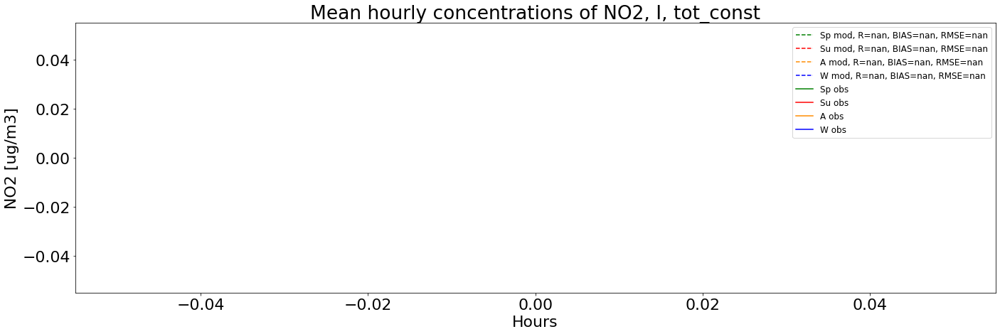

/data/juraj/anaconda/envs/supergeo/lib/python3.8/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)


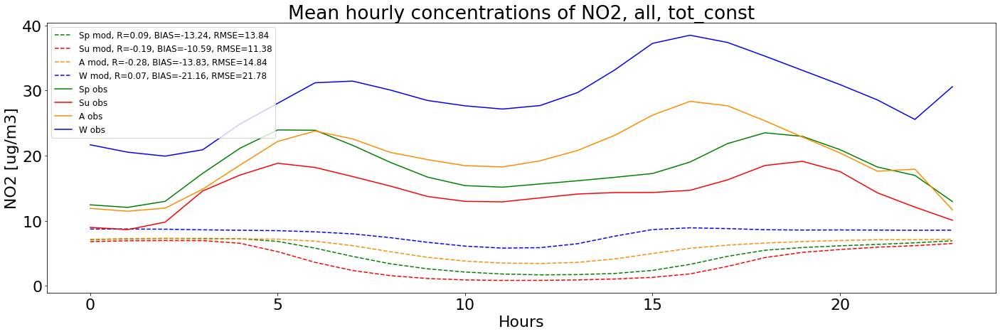

In [41]:
# POTENTIAL USER INPUT 
#for t in stat_types_new:   #uncomment for combinations of station type and location 
for t in all_types_all:     # uncomment for station types and locations as separate plots
#_____________________________________________________________________________________________________________________________    
    #"""  # Uncomment the following 3 conditions for station types and locations as separate plots
    if t in locs:
        selected_stations = list(stat_all.loc[stat_all['loc'] == t].loc[stat_all['coverage'] != 0].index)
    elif t in types:
        selected_stations = list(stat_all.loc[stat_all['type'] == t].loc[stat_all['coverage'] != 0].index)
    else:
        selected_stations = list(stat_all.loc[stat_all['coverage'] != 0].index.values)[1:]  
#_____________________________________________________________________________________________________________________________        
    """  # Uncomment the following 3 conditions for combinations of station type and location 
        
    if t == 'RB':
            #loc_, type_ = 'R', 'B'
            selected_stations = list(stat_all.loc[stat_all['type'] == 'B'].loc[stat_all['loc']=='R'].loc[stat_all['coverage'] != 0].index)
        
    if t == 'OB':
            selected_stations = list(stat_all.loc[stat_all['type'] == 'B'].loc[stat_all['loc']=='U'].loc[stat_all['coverage'] != 0].index) + list(stat_all.loc[stat_all['type'] == 'B'].loc[stat_all['loc']=='S'].loc[stat_all['coverage'] != 0].index)
             
    if t == 'UT':
            selected_stations = list(stat_all.loc[stat_all['type'] == 'T'].loc[stat_all['loc']=='U'].loc[stat_all['coverage'] != 0].index)
    #"""
#_____________________________________________________________________________________________________________________________
    mod_id_jar = data[spec_nick]['MOD'].sel(station = selected_stations, time = data[spec_nick].time.dt.month.isin(season_months['spring'])).groupby('time.hour').mean().mean(dim = 'station')
    mod_id_leto = data[spec_nick]['MOD'].sel(station = selected_stations, time = data[spec_nick].time.dt.month.isin(season_months['summer'])).groupby('time.hour').mean().mean(dim = 'station')
    mod_id_jesen = data[spec_nick]['MOD'].sel(station = selected_stations, time = data[spec_nick].time.dt.month.isin(season_months['autumn'])).groupby('time.hour').mean().mean(dim = 'station')
    mod_id_zima = data[spec_nick]['MOD'].sel(station = selected_stations, time = data[spec_nick].time.dt.month.isin(season_months['winter'])).groupby('time.hour').mean().mean(dim = 'station')
    
    obs_id_jar = data[specific[0]]['OBS'].sel(station = selected_stations, time = data[specific[0]].time.dt.month.isin(season_months['spring'])).groupby('time.hour').mean().mean(dim = 'station')
    obs_id_leto = data[specific[0]]['OBS'].sel(station = selected_stations, time = data[specific[0]].time.dt.month.isin(season_months['summer'])).groupby('time.hour').mean().mean(dim = 'station')
    obs_id_jesen = data[specific[0]]['OBS'].sel(station = selected_stations, time = data[specific[0]].time.dt.month.isin(season_months['autumn'])).groupby('time.hour').mean().mean(dim = 'station')
    obs_id_zima = data[specific[0]]['OBS'].sel(station = selected_stations, time = data[specific[0]].time.dt.month.isin(season_months['winter'])).groupby('time.hour').mean().mean(dim = 'station')
    
    r_jar = mod_id_jar.to_series().corr(obs_id_jar.to_series())
    r_leto = mod_id_leto.to_series().corr(obs_id_leto.to_series())
    r_jesen = mod_id_jesen.to_series().corr(obs_id_jesen.to_series())
    r_zima = mod_id_zima.to_series().corr(obs_id_zima.to_series())
    
    jar_diff = np.array((mod_id_jar - obs_id_jar).to_series().dropna())
    leto_diff = np.array((mod_id_leto - obs_id_leto).to_series().dropna())
    jesen_diff = np.array((mod_id_jesen - obs_id_jesen).to_series().dropna())
    zima_diff = np.array((mod_id_zima - obs_id_zima).to_series().dropna())
    #if len(jar_diff) != 0:
    jar_rmse = np.sqrt(np.sum(jar_diff**2)/len(jar_diff))
    leto_rmse = np.sqrt(np.sum(leto_diff**2)/len(leto_diff))
    jesen_rmse = np.sqrt(np.sum(jesen_diff**2)/len(jesen_diff))
    zima_rmse = np.sqrt(np.sum(zima_diff**2)/len(zima_diff))
    
    jar_bias, leto_bias = np.sum(jar_diff)/len(jar_diff), np.sum(leto_diff)/len(leto_diff)
    jesen_bias, zima_bias = np.sum(jesen_diff)/len(jesen_diff), np.sum(zima_diff)/len(zima_diff)
    #else:
    #    stat_rmse = np.nan
    
    #name_sta = stat[spec_nick].name.loc[stat[spec_nick].index == i].item()
    
    plt.rcParams['figure.figsize'] = 20,7
    plt.rcParams.update({'font.size': 22})

    plt.plot(mod_id_jar.hour, mod_id_jar[:], color ='green', linestyle='--', label = 'Sp mod, R={:0.2f}, BIAS={:0.2f}, RMSE={:0.2f}'.format(r_jar, jar_bias, jar_rmse)) 
    plt.plot(mod_id_leto.hour, mod_id_leto[:], color ='red', linestyle='--', label = 'Su mod, R={:0.2f}, BIAS={:0.2f}, RMSE={:0.2f}'.format(r_leto, leto_bias, leto_rmse))
    plt.plot(mod_id_jesen.hour, mod_id_jesen[:], color ='darkorange', linestyle='--', label = 'A mod, R={:0.2f}, BIAS={:0.2f}, RMSE={:0.2f}'.format(r_jesen, jesen_bias, jesen_rmse)) 
    plt.plot(mod_id_zima.hour, mod_id_zima[:], color ='blue', linestyle='--', label = 'W mod, R={:0.2f}, BIAS={:0.2f}, RMSE={:0.2f}'.format(r_zima, zima_bias, zima_rmse))
    
    plt.plot(obs_id_jar.hour, obs_id_jar[:], color ='green', label = 'Sp obs') 
    plt.plot(obs_id_leto.hour, obs_id_leto[:], color ='red', label = 'Su obs')
    plt.plot(obs_id_jesen.hour, obs_id_jesen[:], color ='darkorange', label = 'A obs') 
    plt.plot(obs_id_zima.hour, obs_id_zima[:], color ='blue', label = 'W obs')
    
    plt.legend(fontsize=12)                
    plt.title('Mean diurnal profile of {0} concentrations, {1}, {2}'.format(v,t,spec_nick))                               
    plt.xlabel('Hours')
    plt.ylabel('{0} [{1}]'.format(v,units))
    plt.tight_layout()

    if save:
        plt.savefig('{0}/MDPS_{1}_{2}_{3}_{4}.png'.format(graphs_path,nick,v,t,spec_nick), dpi=300)
        
    plt.show()                
    plt.close() 

### For station types - normalized

Normalized version of the previous plot, same rules apply.

In [44]:
save = False
spec_nick = 'ref'

#stat_types_new = ['RB', 'OB', 'UT'] #uncomment for combinations of station type and location

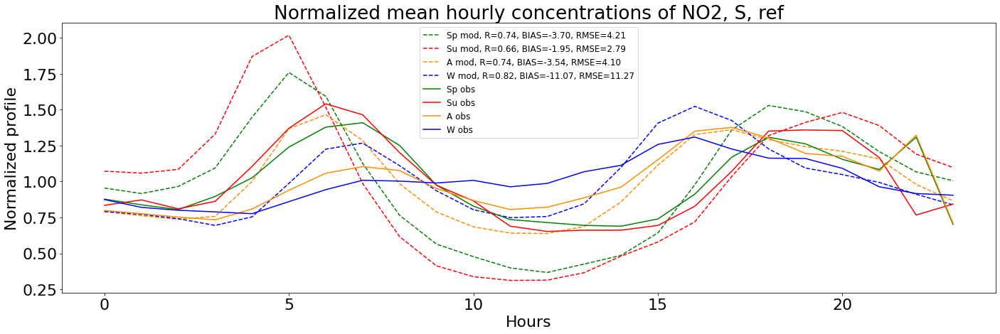

/data/juraj/anaconda/envs/supergeo/lib/python3.8/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)


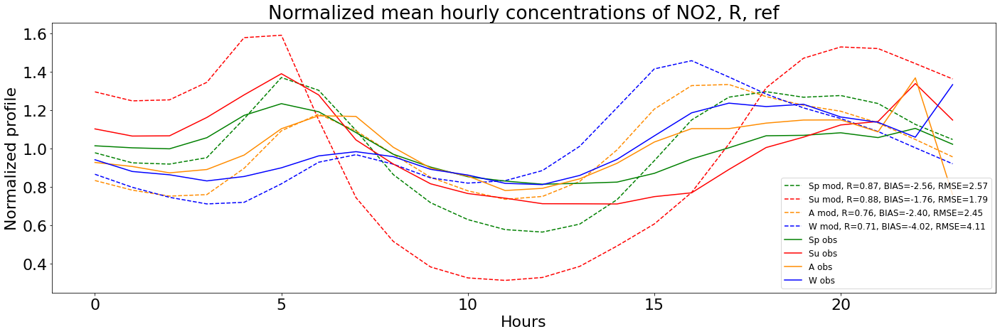

/data/juraj/anaconda/envs/supergeo/lib/python3.8/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)


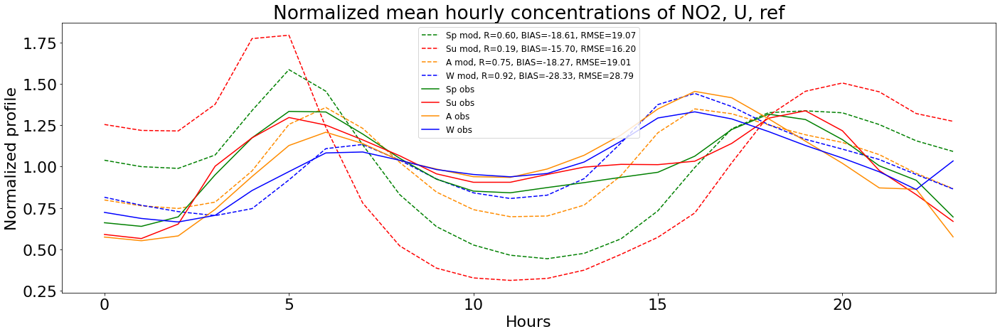

/data/juraj/anaconda/envs/supergeo/lib/python3.8/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)


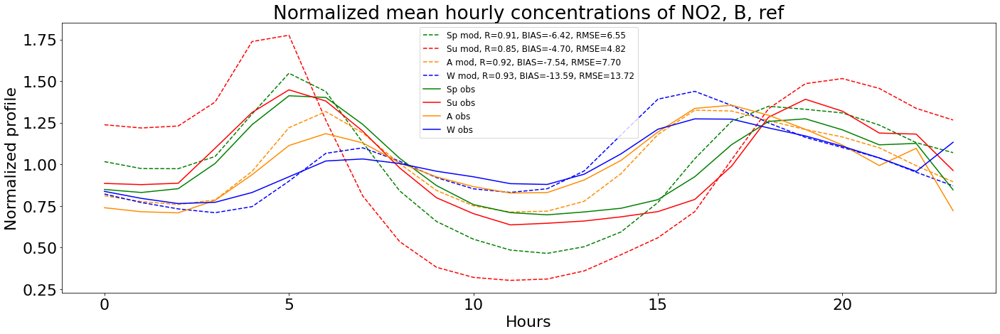

/data/juraj/anaconda/envs/supergeo/lib/python3.8/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)


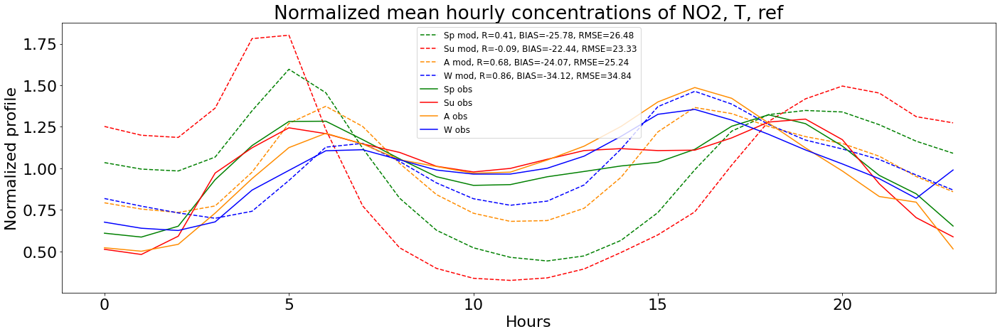

/data/juraj/anaconda/envs/supergeo/lib/python3.8/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)
<ipython-input-45-c0409cd288c0>:49: RuntimeWarning: invalid value encountered in double_scalars
  jar_rmse = np.sqrt(np.sum(jar_diff**2)/len(jar_diff))
<ipython-input-45-c0409cd288c0>:50: RuntimeWarning: invalid value encountered in double_scalars
  leto_rmse = np.sqrt(np.sum(leto_diff**2)/len(leto_diff))
<ipython-input-45-c0409cd288c0>:51: RuntimeWarning: invalid value encountered in double_scalars
  jesen_rmse = np.sqrt(np.sum(jesen_diff**2)/len(jesen_diff))
<ipython-input-45-c0409cd288c0>:52: RuntimeWarning: invalid value encountered in double_scalars
  zima_rmse = np.sqrt(np.sum(zima_diff**2)/len(zima_diff))
<ipython-input-45-c0409cd288c0>:54: RuntimeWarning: invalid value encountered in double_scalars
  jar_bias, leto_bias = np.sum(jar_diff)/len(jar_diff), np.sum(leto_diff)/len(leto_diff)
<ipython-input-45-c040

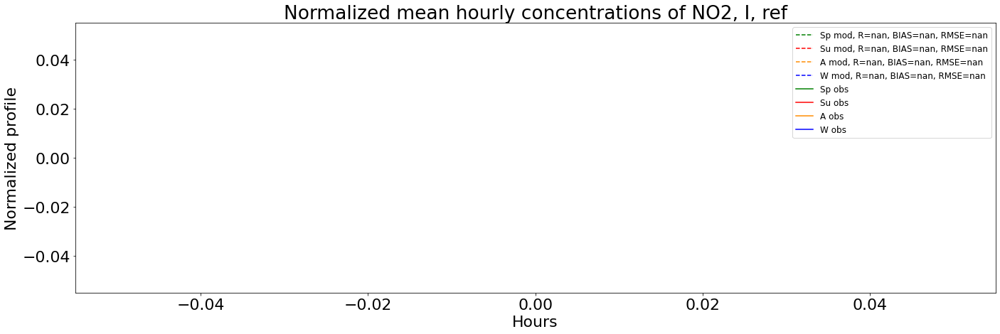

/data/juraj/anaconda/envs/supergeo/lib/python3.8/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)


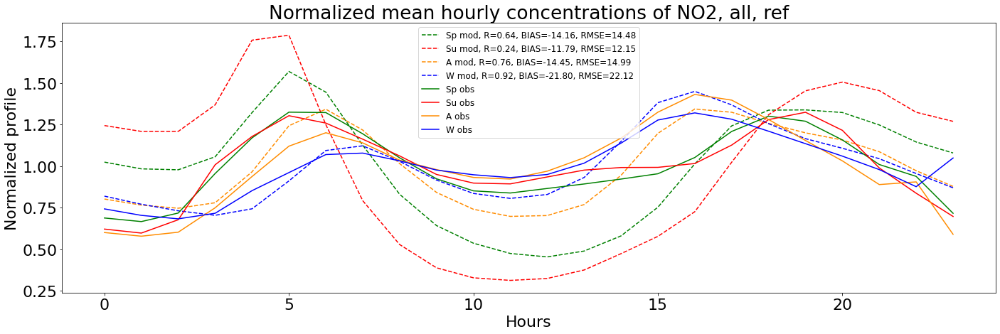

In [45]:
#for t in stat_types_new:    #uncomment for combinations of station type and location
for t in all_types_all:     # uncomment for station types and locations as separate plots
#____________________________________________________________________________________________________________________________    
    #"""   # Uncomment the following 3 conditions for station types and locations as separate plots
    if t in locs:
        selected_stations = list(stat_all.loc[stat_all['loc'] == t].loc[stat_all['coverage'] != 0].index)
    elif t in types:
        selected_stations = list(stat_all.loc[stat_all['type'] == t].loc[stat_all['coverage'] != 0].index)
    else:
        selected_stations = list(stat_all.loc[stat_all['coverage'] != 0].index.values)[1:]  
#_____________________________________________________________________________________________________________________________        
    """# Uncomment the following 3 conditions for combinations of station type and location 
        
    if t == 'RB':
            #loc_, type_ = 'R', 'B'
            selected_stations = list(stat_all.loc[stat_all['type'] == 'B'].loc[stat_all['loc']=='R'].loc[stat_all['coverage'] != 0].index)
        
    if t == 'OB':
            selected_stations = list(stat_all.loc[stat_all['type'] == 'B'].loc[stat_all['loc']=='U'].loc[stat_all['coverage'] != 0].index) + list(stat_all.loc[stat_all['type'] == 'B'].loc[stat_all['loc']=='S'].loc[stat_all['coverage'] != 0].index)
             
    if t == 'UT':
            selected_stations = list(stat_all.loc[stat_all['type'] == 'T'].loc[stat_all['loc']=='U'].loc[stat_all['coverage'] != 0].index)
    #"""
#_____________________________________________________________________________________________________________________________
    mod_id_jar = data[spec_nick]['MOD'].sel(station = selected_stations, time = data[spec_nick].time.dt.month.isin(season_months['spring'])).groupby('time.hour').mean().mean(dim = 'station')
    mod_id_leto = data[spec_nick]['MOD'].sel(station = selected_stations, time = data[spec_nick].time.dt.month.isin(season_months['summer'])).groupby('time.hour').mean().mean(dim = 'station')
    mod_id_jar_norm, mod_id_leto_norm = 24*mod_id_jar/mod_id_jar.sum(), 24*mod_id_leto/mod_id_leto.sum()
    mod_id_jesen = data[spec_nick]['MOD'].sel(station = selected_stations, time = data[spec_nick].time.dt.month.isin(season_months['autumn'])).groupby('time.hour').mean().mean(dim = 'station')
    mod_id_zima = data[spec_nick]['MOD'].sel(station = selected_stations, time = data[spec_nick].time.dt.month.isin(season_months['winter'])).groupby('time.hour').mean().mean(dim = 'station')
    mod_id_jesen_norm, mod_id_zima_norm = 24*mod_id_jesen/mod_id_jesen.sum(), 24*mod_id_zima/mod_id_zima.sum()
    
    obs_id_jar = data[specific[0]]['OBS'].sel(station = selected_stations, time = data[specific[0]].time.dt.month.isin(season_months['spring'])).groupby('time.hour').mean().mean(dim = 'station')
    obs_id_leto = data[specific[0]]['OBS'].sel(station = selected_stations, time = data[specific[0]].time.dt.month.isin(season_months['summer'])).groupby('time.hour').mean().mean(dim = 'station')
    obs_id_jar_norm, obs_id_leto_norm = 24*obs_id_jar/obs_id_jar.sum(), 24*obs_id_leto/obs_id_leto.sum()
    obs_id_jesen = data[specific[0]]['OBS'].sel(station = selected_stations, time = data[specific[0]].time.dt.month.isin(season_months['autumn'])).groupby('time.hour').mean().mean(dim = 'station')
    obs_id_zima = data[specific[0]]['OBS'].sel(station = selected_stations, time = data[specific[0]].time.dt.month.isin(season_months['winter'])).groupby('time.hour').mean().mean(dim = 'station')
    obs_id_jesen_norm, obs_id_zima_norm = 24*obs_id_jesen/obs_id_jesen.sum(), 24*obs_id_zima/obs_id_zima.sum()
    
    r_jar = mod_id_jar.to_series().corr(obs_id_jar.to_series())
    r_leto = mod_id_leto.to_series().corr(obs_id_leto.to_series())
    r_jesen = mod_id_jesen.to_series().corr(obs_id_jesen.to_series())
    r_zima = mod_id_zima.to_series().corr(obs_id_zima.to_series())
    
    jar_diff = np.array((mod_id_jar - obs_id_jar).to_series().dropna())
    leto_diff = np.array((mod_id_leto - obs_id_leto).to_series().dropna())
    jesen_diff = np.array((mod_id_jesen - obs_id_jesen).to_series().dropna())
    zima_diff = np.array((mod_id_zima - obs_id_zima).to_series().dropna())
    #if len(jar_diff) != 0:
    jar_rmse = np.sqrt(np.sum(jar_diff**2)/len(jar_diff))
    leto_rmse = np.sqrt(np.sum(leto_diff**2)/len(leto_diff))
    jesen_rmse = np.sqrt(np.sum(jesen_diff**2)/len(jesen_diff))
    zima_rmse = np.sqrt(np.sum(zima_diff**2)/len(zima_diff))
    
    jar_bias, leto_bias = np.sum(jar_diff)/len(jar_diff), np.sum(leto_diff)/len(leto_diff)
    jesen_bias, zima_bias = np.sum(jesen_diff)/len(jesen_diff), np.sum(zima_diff)/len(zima_diff)
    
    #name_sta = stat[spec_nick].name.loc[stat[spec_nick].index == i].item()
    
    plt.rcParams['figure.figsize'] = 20,7
    plt.rcParams.update({'font.size': 22})

    plt.plot(mod_id_jar.hour, mod_id_jar_norm[:], color ='green', linestyle='--', label = 'Sp mod, R={:0.2f}, BIAS={:0.2f}, RMSE={:0.2f}'.format(r_jar, jar_bias, jar_rmse)) 
    plt.plot(mod_id_leto.hour, mod_id_leto_norm[:], color ='red', linestyle='--', label = 'Su mod, R={:0.2f}, BIAS={:0.2f}, RMSE={:0.2f}'.format(r_leto, leto_bias, leto_rmse))
    plt.plot(mod_id_jesen.hour, mod_id_jesen_norm[:], color ='darkorange', linestyle='--', label = 'A mod, R={:0.2f}, BIAS={:0.2f}, RMSE={:0.2f}'.format(r_jesen, jesen_bias, jesen_rmse)) 
    plt.plot(mod_id_zima.hour, mod_id_zima_norm[:], color ='blue', linestyle='--', label = 'W mod, R={:0.2f}, BIAS={:0.2f}, RMSE={:0.2f}'.format(r_zima, zima_bias, zima_rmse))
    
    plt.plot(obs_id_jar.hour, obs_id_jar_norm[:], color ='green', label = 'Sp obs') 
    plt.plot(obs_id_leto.hour, obs_id_leto_norm[:], color ='red', label = 'Su obs')
    plt.plot(obs_id_jesen.hour, obs_id_jesen_norm[:], color ='darkorange', label = 'A obs') 
    plt.plot(obs_id_zima.hour, obs_id_zima_norm[:], color ='blue', label = 'W obs')
    
    plt.legend(fontsize=12)                
    plt.title('Normalized mean diurnal profile of {0} concentrations, {1}, {2}'.format(v,t,spec_nick))                               
    plt.xlabel('Hours')
    plt.ylabel('Normalized profile')
    plt.tight_layout()

    if save:
        plt.savefig('{0}/NMDPS_{1}_{2}_{3}_{4}.png'.format(graphs_path,nick,v,t,spec_nick), dpi=300)
        
    plt.show()                
    plt.close() 

### For station types - scaled

Scaled version of the previous plot, same rules apply.

In [46]:
save = False
spec_nick = 'ref'

#stat_types_new = ['RB', 'OB', 'UT'] #uncomment for combinations of station type and location

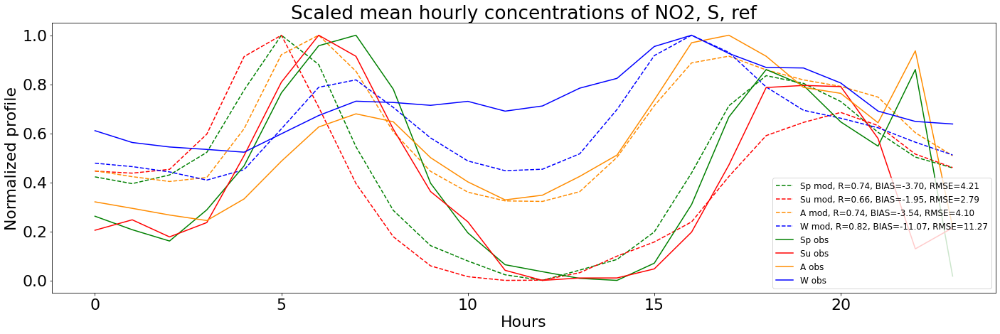

/data/juraj/anaconda/envs/supergeo/lib/python3.8/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)


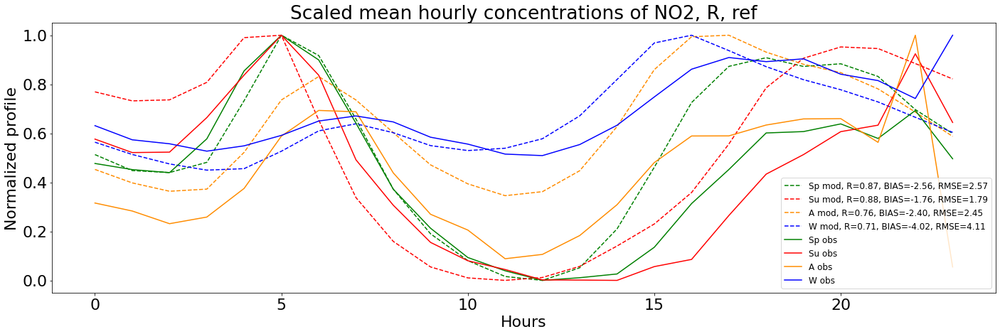

/data/juraj/anaconda/envs/supergeo/lib/python3.8/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)


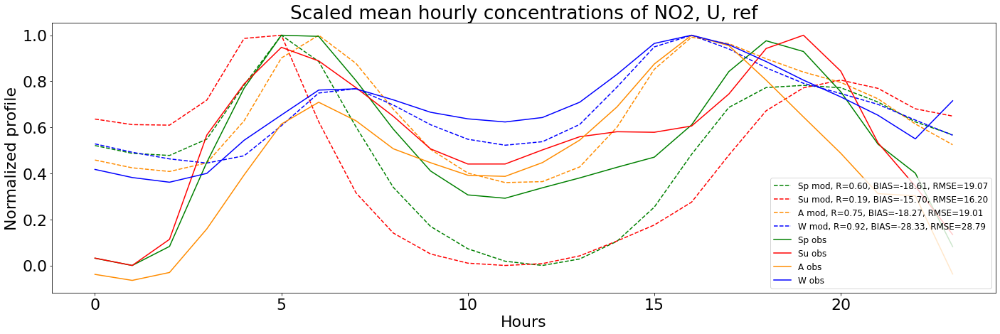

/data/juraj/anaconda/envs/supergeo/lib/python3.8/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)


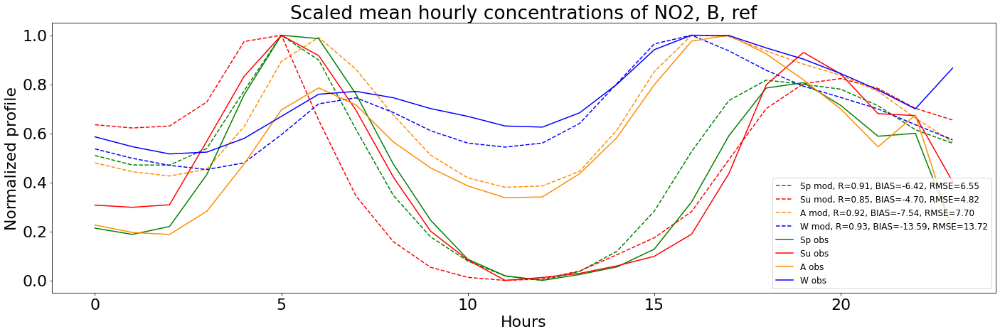

/data/juraj/anaconda/envs/supergeo/lib/python3.8/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)


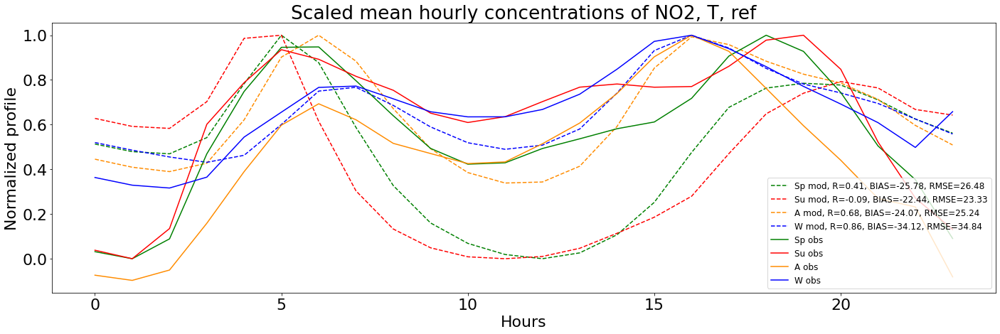

/data/juraj/anaconda/envs/supergeo/lib/python3.8/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)
/data/juraj/anaconda/envs/supergeo/lib/python3.8/site-packages/xarray/core/nputils.py:215: RuntimeWarning: All-NaN slice encountered
  result = getattr(npmodule, name)(values, axis=axis, **kwargs)
<ipython-input-48-24e07346fca4>:63: RuntimeWarning: invalid value encountered in double_scalars
  jar_rmse = np.sqrt(np.sum(jar_diff**2)/len(jar_diff))
<ipython-input-48-24e07346fca4>:64: RuntimeWarning: invalid value encountered in double_scalars
  leto_rmse = np.sqrt(np.sum(leto_diff**2)/len(leto_diff))
<ipython-input-48-24e07346fca4>:65: RuntimeWarning: invalid value encountered in double_scalars
  jesen_rmse = np.sqrt(np.sum(jesen_diff**2)/len(jesen_diff))
<ipython-input-48-24e07346fca4>:66: RuntimeWarning: invalid value encountered in double_scalars
  zima_rmse = np.sqrt(np.sum(zima_diff**2)/len(zima_diff))
<ipython-i

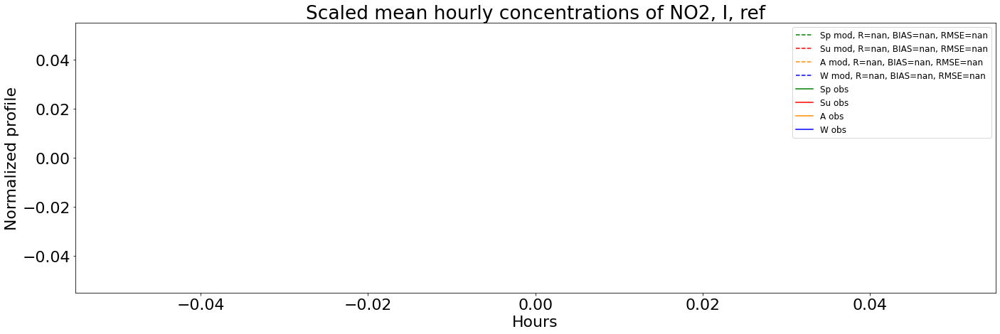

/data/juraj/anaconda/envs/supergeo/lib/python3.8/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)


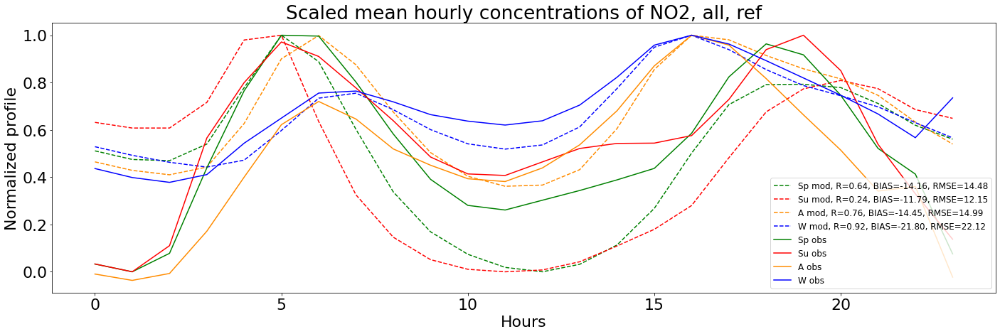

In [48]:
#for t in stat_types_new:    #uncomment for combinations of station type and location
for t in all_types_all:     # uncomment for station types and locations as separate plots
#____________________________________________________________________________________________________________________________    
    #"""   # Uncomment the following 3 conditions for station types and locations as separate plots
    if t in locs:
        selected_stations = list(stat_all.loc[stat_all['loc'] == t].loc[stat_all['coverage'] != 0].index)
    elif t in types:
        selected_stations = list(stat_all.loc[stat_all['type'] == t].loc[stat_all['coverage'] != 0].index)
    else:
        selected_stations = list(stat_all.loc[stat_all['coverage'] != 0].index.values)[1:]  
#_____________________________________________________________________________________________________________________________        
    """# Uncomment the following 3 conditions for combinations of station type and location 
        
    if t == 'RB':
            #loc_, type_ = 'R', 'B'
            selected_stations = list(stat_all.loc[stat_all['type'] == 'B'].loc[stat_all['loc']=='R'].loc[stat_all['coverage'] != 0].index)
        
    if t == 'OB':
            selected_stations = list(stat_all.loc[stat_all['type'] == 'B'].loc[stat_all['loc']=='U'].loc[stat_all['coverage'] != 0].index) + list(stat_all.loc[stat_all['type'] == 'B'].loc[stat_all['loc']=='S'].loc[stat_all['coverage'] != 0].index)
             
    if t == 'UT':
            selected_stations = list(stat_all.loc[stat_all['type'] == 'T'].loc[stat_all['loc']=='U'].loc[stat_all['coverage'] != 0].index)
    #"""
#_____________________________________________________________________________________________________________________________
    mod_id_jar = data[spec_nick]['MOD'].sel(station = selected_stations, time = data[spec_nick].time.dt.month.isin(season_months['spring'])).groupby('time.hour').mean().mean(dim = 'station')
    mod_id_leto = data[spec_nick]['MOD'].sel(station = selected_stations, time = data[spec_nick].time.dt.month.isin(season_months['summer'])).groupby('time.hour').mean().mean(dim = 'station')
    mod_max_jar, mod_max_leto = mod_id_jar.max().item(), mod_id_leto.max().item()
    mod_min_jar, mod_min_leto = mod_id_jar.min().item(), mod_id_leto.min().item()
    mod_id_jar_scaled = (mod_id_jar - mod_min_jar)/(mod_max_jar - mod_min_jar)
    mod_id_leto_scaled = (mod_id_leto - mod_min_leto)/(mod_max_leto - mod_min_leto)  
    
    mod_id_jesen = data[spec_nick]['MOD'].sel(station = selected_stations, time = data[spec_nick].time.dt.month.isin(season_months['autumn'])).groupby('time.hour').mean().mean(dim = 'station')
    mod_id_zima = data[spec_nick]['MOD'].sel(station = selected_stations, time = data[spec_nick].time.dt.month.isin(season_months['winter'])).groupby('time.hour').mean().mean(dim = 'station')
    mod_max_jesen, mod_max_zima = mod_id_jesen.max().item(), mod_id_zima.max().item()
    mod_min_jesen, mod_min_zima = mod_id_jar.min().item(), mod_id_leto.min().item()
    mod_id_jesen_scaled = (mod_id_jesen - mod_min_jesen)/(mod_max_jesen - mod_min_jesen)
    mod_id_zima_scaled = (mod_id_zima - mod_min_zima)/(mod_max_zima - mod_min_zima)
    
    obs_id_jar = data[specific[0]]['OBS'].sel(station = selected_stations, time = data[specific[0]].time.dt.month.isin(season_months['spring'])).groupby('time.hour').mean().mean(dim = 'station')
    obs_id_leto = data[specific[0]]['OBS'].sel(station = selected_stations, time = data[specific[0]].time.dt.month.isin(season_months['summer'])).groupby('time.hour').mean().mean(dim = 'station')
    obs_max_jar, obs_max_leto = obs_id_jar.max().item(), obs_id_leto.max().item()
    obs_min_jar, obs_min_leto = obs_id_jar.min().item(), obs_id_leto.min().item()
    obs_id_jar_scaled = (obs_id_jar - obs_min_jar)/(obs_max_jar - obs_min_jar)
    obs_id_leto_scaled = (obs_id_leto - obs_min_leto)/(obs_max_leto - obs_min_leto)

    obs_id_jesen = data[specific[0]]['OBS'].sel(station = selected_stations, time = data[specific[0]].time.dt.month.isin(season_months['autumn'])).groupby('time.hour').mean().mean(dim = 'station')
    obs_id_zima = data[specific[0]]['OBS'].sel(station = selected_stations, time = data[specific[0]].time.dt.month.isin(season_months['winter'])).groupby('time.hour').mean().mean(dim = 'station')
    obs_max_jesen, obs_max_zima = obs_id_jesen.max().item(), obs_id_zima.max().item()
    obs_min_jesen, obs_min_zima = obs_id_jar.min().item(), obs_id_leto.min().item()
    obs_id_jesen_scaled = (obs_id_jesen - obs_min_jesen)/(obs_max_jesen - obs_min_jesen)
    obs_id_zima_scaled = (obs_id_zima - obs_min_zima)/(obs_max_zima - obs_min_zima)
    
    r_jar = mod_id_jar.to_series().corr(obs_id_jar.to_series())
    r_leto = mod_id_leto.to_series().corr(obs_id_leto.to_series())
    r_jesen = mod_id_jesen.to_series().corr(obs_id_jesen.to_series())
    r_zima = mod_id_zima.to_series().corr(obs_id_zima.to_series())
    
    jar_diff = np.array((mod_id_jar - obs_id_jar).to_series().dropna())
    leto_diff = np.array((mod_id_leto - obs_id_leto).to_series().dropna())
    jesen_diff = np.array((mod_id_jesen - obs_id_jesen).to_series().dropna())
    zima_diff = np.array((mod_id_zima - obs_id_zima).to_series().dropna())
    #if len(jar_diff) != 0:
    jar_rmse = np.sqrt(np.sum(jar_diff**2)/len(jar_diff))
    leto_rmse = np.sqrt(np.sum(leto_diff**2)/len(leto_diff))
    jesen_rmse = np.sqrt(np.sum(jesen_diff**2)/len(jesen_diff))
    zima_rmse = np.sqrt(np.sum(zima_diff**2)/len(zima_diff))
    
    jar_bias, leto_bias = np.sum(jar_diff)/len(jar_diff), np.sum(leto_diff)/len(leto_diff)
    jesen_bias, zima_bias = np.sum(jesen_diff)/len(jesen_diff), np.sum(zima_diff)/len(zima_diff)
    
    #name_sta = stat[spec_nick].name.loc[stat[spec_nick].index == i].item()
    
    plt.rcParams['figure.figsize'] = 20,7
    plt.rcParams.update({'font.size': 22})

    plt.plot(mod_id_jar.hour, mod_id_jar_scaled[:], color ='green', linestyle='--', label = 'Sp mod, R={:0.2f}, BIAS={:0.2f}, RMSE={:0.2f}'.format(r_jar, jar_bias, jar_rmse)) 
    plt.plot(mod_id_leto.hour, mod_id_leto_scaled[:], color ='red', linestyle='--', label = 'Su mod, R={:0.2f}, BIAS={:0.2f}, RMSE={:0.2f}'.format(r_leto, leto_bias, leto_rmse))
    plt.plot(mod_id_jesen.hour, mod_id_jesen_scaled[:], color ='darkorange', linestyle='--', label = 'A mod, R={:0.2f}, BIAS={:0.2f}, RMSE={:0.2f}'.format(r_jesen, jesen_bias, jesen_rmse)) 
    plt.plot(mod_id_zima.hour, mod_id_zima_scaled[:], color ='blue', linestyle='--', label = 'W mod, R={:0.2f}, BIAS={:0.2f}, RMSE={:0.2f}'.format(r_zima, zima_bias, zima_rmse))
    
    plt.plot(obs_id_jar.hour, obs_id_jar_scaled[:], color ='green', label = 'Sp obs') 
    plt.plot(obs_id_leto.hour, obs_id_leto_scaled[:], color ='red', label = 'Su obs')
    plt.plot(obs_id_jesen.hour, obs_id_jesen_scaled[:], color ='darkorange', label = 'A obs') 
    plt.plot(obs_id_zima.hour, obs_id_zima_scaled[:], color ='blue', label = 'W obs')
    
    plt.legend(fontsize=12)                
    plt.title('Scaled mean diurnal profile of {0} concentrations, {1}, {2}'.format(v,t,spec_nick))                               
    plt.xlabel('Hours')
    plt.ylabel('Normalized profile')
    plt.tight_layout()

    if save:
        plt.savefig('{0}/SMDPS_{1}_{2}_{3}_{4}.png'.format(graphs_path,nick,v,t,spec_nick), dpi=300)
        
    plt.show()                
    plt.close() 

## Mean diurnal profiles for the months of the year

In [14]:
### USER INPUT
# Choose stations to plot
#ID = list(stat_all.loc[stat_all.coverage != 0].index.values)[1:]  #all stations with non-zero coverage
ID = [11813,11916]    # selected stations
spec_nick = 'tot_const'   #simulation specific name (as defined in the first cell of the notebook in "specific" field)

save = False   # save the plots?  

/data/juraj/anaconda/envs/supergeo/lib/python3.8/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)
/data/juraj/anaconda/envs/supergeo/lib/python3.8/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)
/data/juraj/anaconda/envs/supergeo/lib/python3.8/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)
/data/juraj/anaconda/envs/supergeo/lib/python3.8/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)
/data/juraj/anaconda/envs/supergeo/lib/python3.8/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)


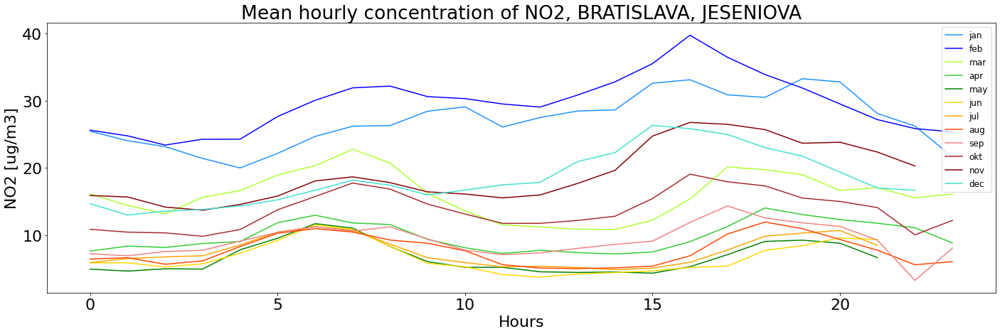

/data/juraj/anaconda/envs/supergeo/lib/python3.8/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)
/data/juraj/anaconda/envs/supergeo/lib/python3.8/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)
/data/juraj/anaconda/envs/supergeo/lib/python3.8/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)
/data/juraj/anaconda/envs/supergeo/lib/python3.8/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)
/data/juraj/anaconda/envs/supergeo/lib/python3.8/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)
/data/juraj/anaconda/envs/supergeo/lib/python3.8/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return 

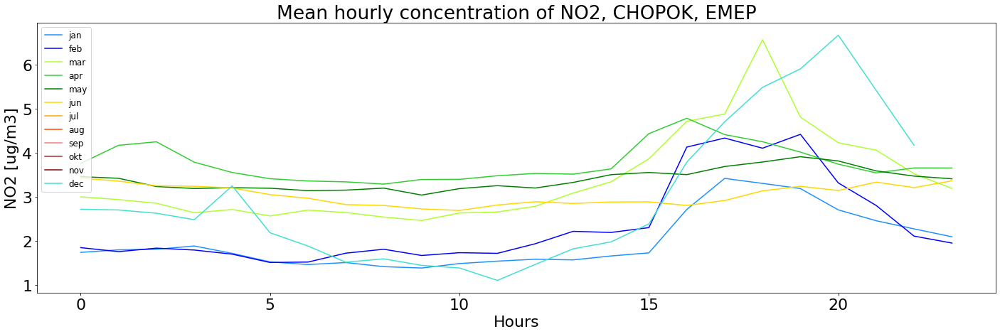

In [15]:
if save:
    print('Plots will be saved at:{}'.format(save_path))
mesiace = ['jan','feb','mar','apr','may','jun','jul','aug','sep','okt','nov','dec']
colors2 = ['dodgerblue','blue','greenyellow','limegreen','green','gold','orange','orangered','lightcoral','brown','maroon','turquoise']
color_list2 = {}
for i, m in enumerate(mesiace):
    color_list2[m] = colors2[i]

for i in ID:    
    name_sta = stat[specific[0]].name.loc[stat[specific[0]].index == i].item()
    
    plt.rcParams['figure.figsize'] = 20,7
    plt.rcParams.update({'font.size': 22})
    
    for m in mesiace:
        obs_id = data[specific[0]]['OBS'].sel(station = i, time = data[specific[0]].time.dt.month.isin(season_months[m])).groupby('time.hour').mean()   
        plt.plot(obs_id.hour, obs_id[:], label = m, color = color_list2[m]) 

    plt.legend(fontsize=12)                
    plt.title('Mean diurnal profile of {0} concentrations, {1}'.format(v,name_sta))                               
    plt.xlabel('Hours')
    plt.ylabel('{0} [{1}]'.format(v,units))
    plt.tight_layout()

    if save:
        plt.savefig('{0}/MDPM_{1}_{2}_{3}_{4}.png'.format(graphs_path,nick,v,i,spec_nick), dpi=300)    
    plt.show()                
    plt.close() 

## Summertime vs wintertime for stations

In [19]:
### USER INPUT
# Choose stations to plot
ID = list(stat_all.loc[stat_all.coverage != 0].index.values)[1:]
#ID = [11813,11916]    # selected stations

sum_time = 'apr'
win_time = 'mar'
spec_nick = 'cop'

save = False   # save the plots?  

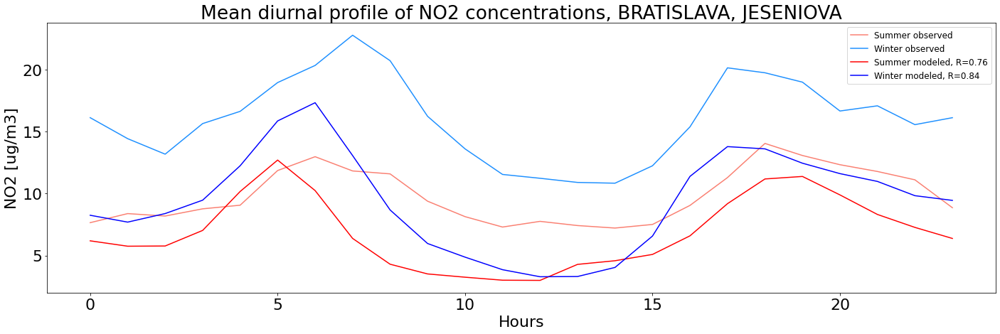

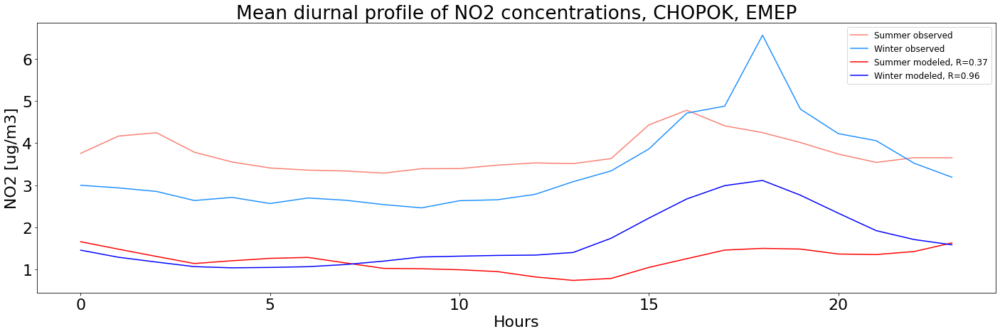

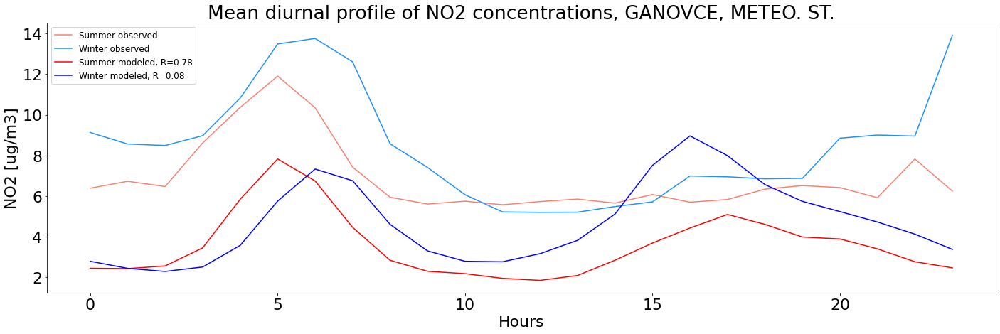

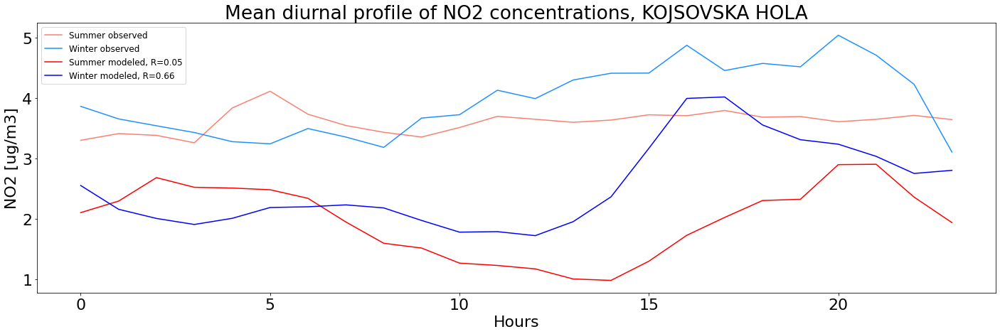

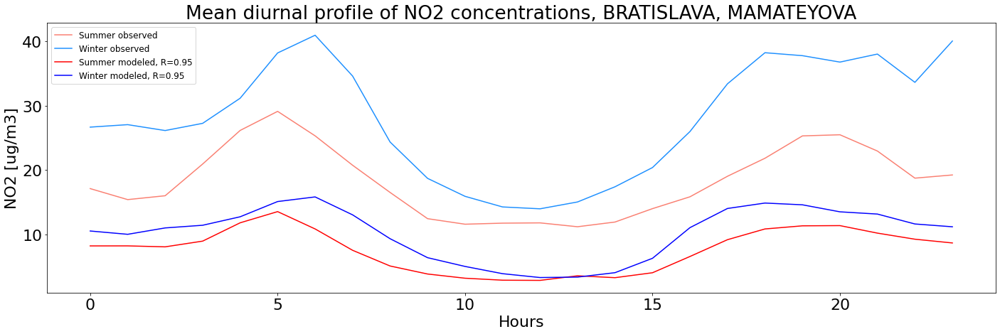

...

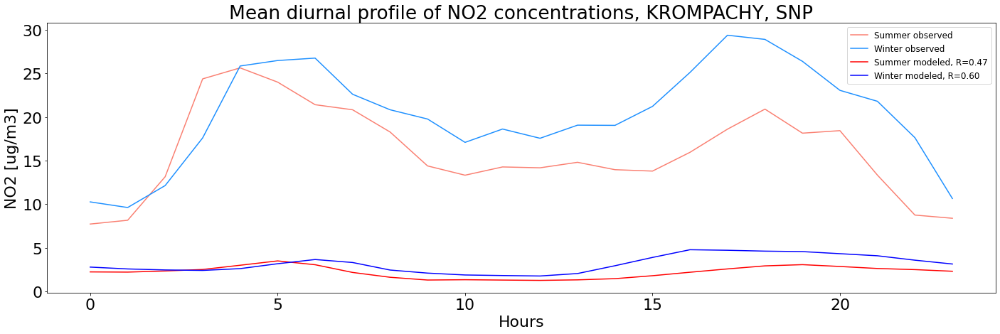

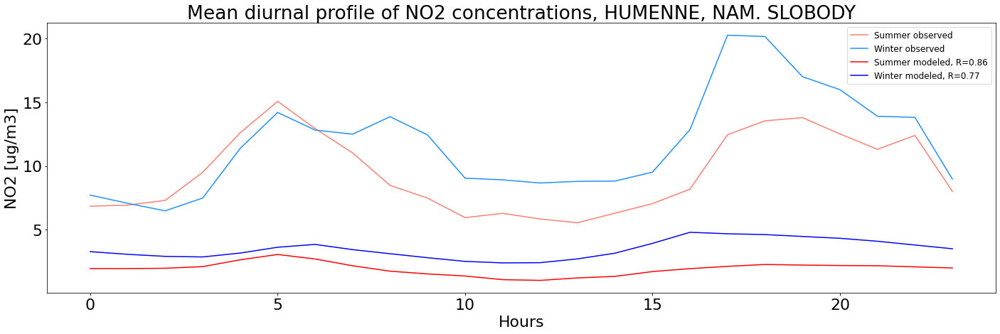

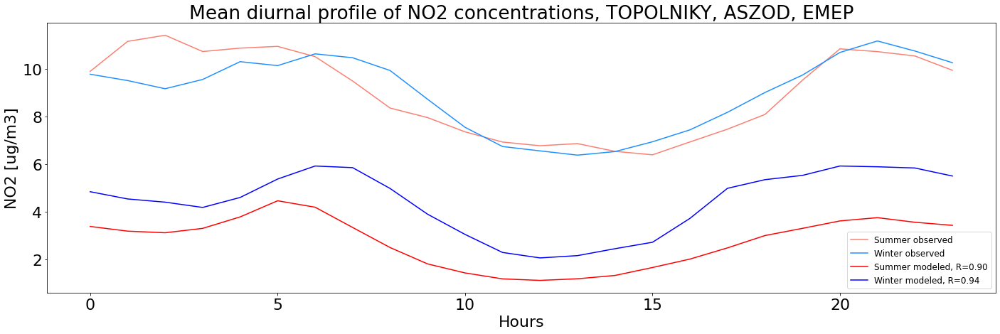

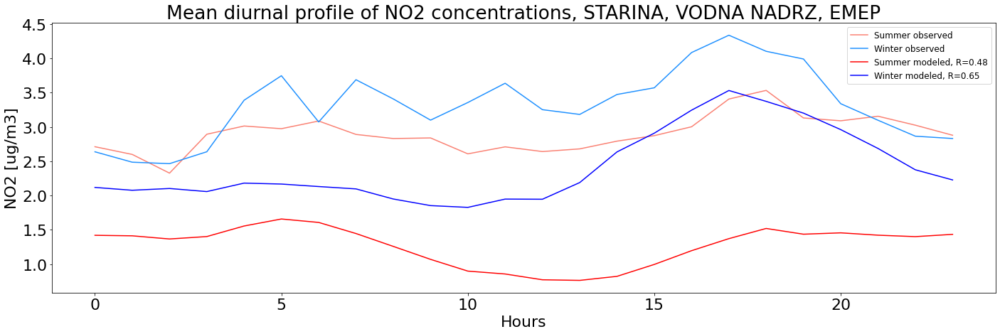

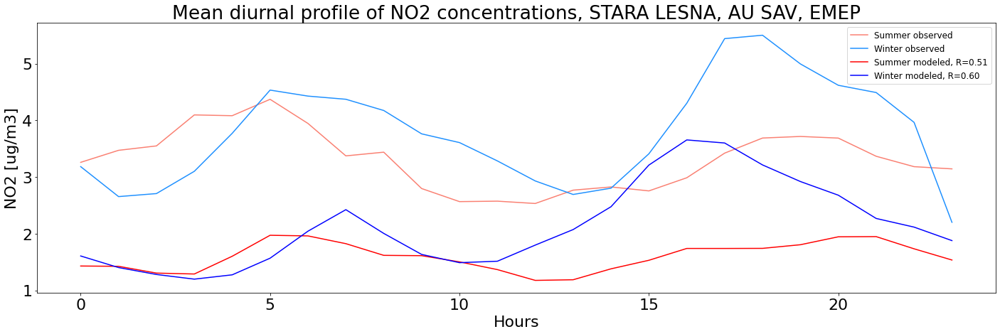

In [21]:
if save:
    print('Plots will be saved at:{}'.format(save_path))
for i in ID:    
    
    obs_id_leto = data[specific[0]]['OBS'].sel(station = i, time = data[specific[0]].time.dt.month.isin(season_months[sum_time])).groupby('time.hour').mean()
    obs_id_zima = data[specific[0]]['OBS'].sel(station = i, time = data[specific[0]].time.dt.month.isin(season_months[win_time])).groupby('time.hour').mean()
    
    mod_id_leto = data[spec_nick]['MOD'].sel(station = i, time = data[spec_nick].time.dt.month.isin(season_months[sum_time])).groupby('time.hour').mean()
    mod_id_zima = data[spec_nick]['MOD'].sel(station = i, time = data[spec_nick].time.dt.month.isin(season_months[win_time])).groupby('time.hour').mean()
    
    r_leto = mod_id_leto.to_series().corr(obs_id_leto.to_series())
    r_zima = mod_id_zima.to_series().corr(obs_id_zima.to_series())
    
    name_sta = stat[specific[0]].name.loc[stat[specific[0]].index == i].item()
    
    plt.rcParams['figure.figsize'] = 20,7
    plt.rcParams.update({'font.size': 22})

    plt.plot(obs_id_leto.hour, obs_id_leto[:], color ='salmon', label = 'Summer observed') 
    plt.plot(obs_id_zima.hour, obs_id_zima[:], color ='dodgerblue', label = 'Winter observed')
    
    plt.plot(mod_id_leto.hour, mod_id_leto[:], color ='red', label = 'Summer modeled, R={:0.2f}'.format(r_leto))
    plt.plot(mod_id_zima.hour, mod_id_zima[:], color ='blue', label = 'Winter modeled, R={:0.2f}'.format(r_zima))

    plt.legend(fontsize=12)                
    plt.title('Mean diurnal profile of {0} concentrations, {1}'.format(v,name_sta))                               
    plt.xlabel('Hours')
    plt.ylabel('{0} [{1}]'.format(v,units))
    plt.tight_layout()

    if save:
        plt.savefig('{0}/MDPSW_{1}_{2}_{3}_{4}.png'.format(graphs_path,nick,v,i,spec_nick), dpi=300) 
        
    plt.show()                
    plt.close() 

## Summertime vs. wintertime for station types 

In [22]:
sum_time = 'apr'
win_time = 'mar'
spec_nick = 'cop'

save = False

/data/juraj/anaconda/envs/supergeo/lib/python3.8/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)


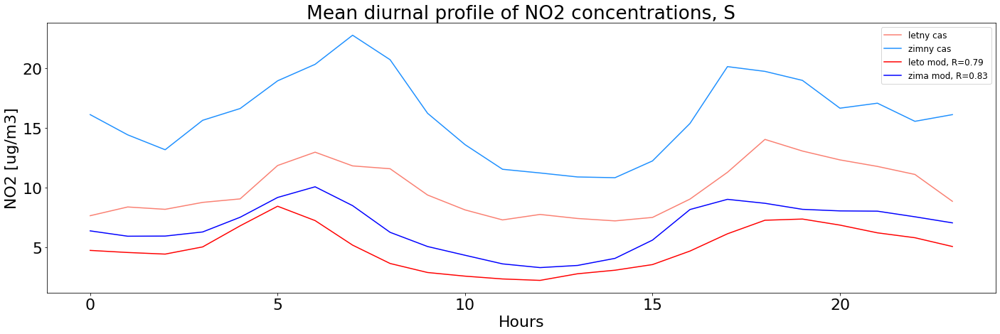

/data/juraj/anaconda/envs/supergeo/lib/python3.8/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)


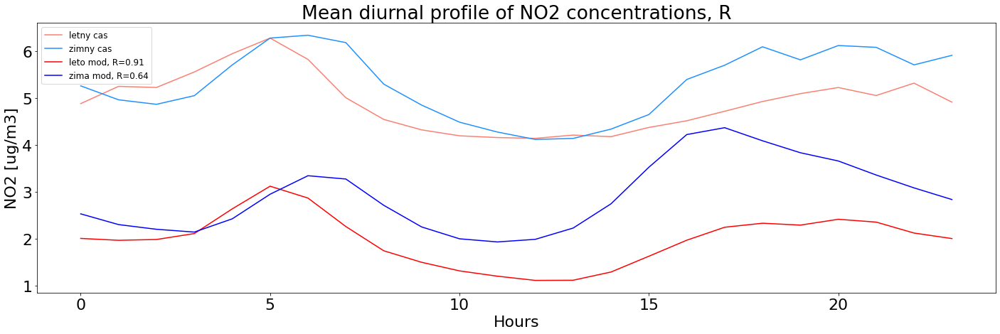

/data/juraj/anaconda/envs/supergeo/lib/python3.8/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)


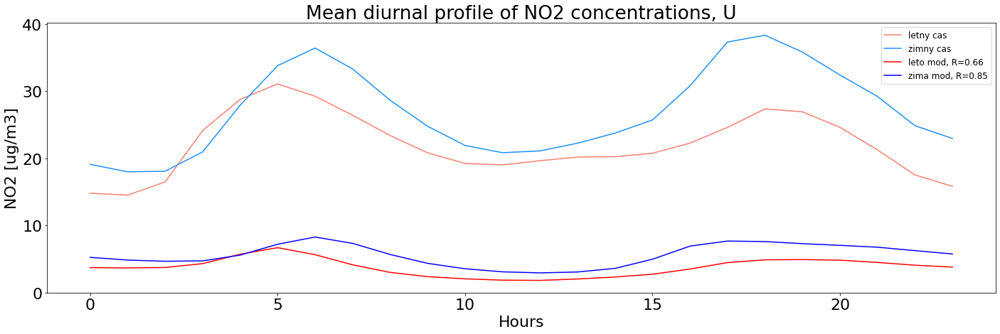

/data/juraj/anaconda/envs/supergeo/lib/python3.8/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)


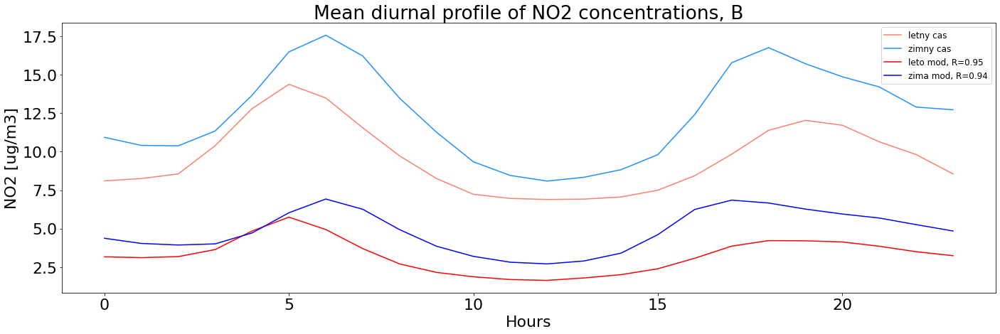

/data/juraj/anaconda/envs/supergeo/lib/python3.8/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)


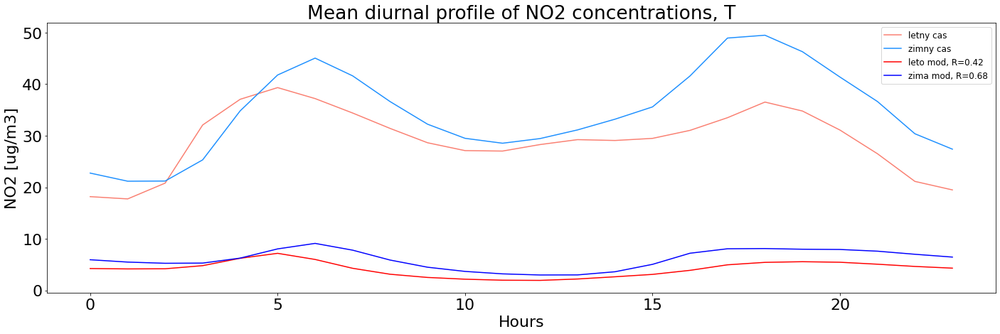

/data/juraj/anaconda/envs/supergeo/lib/python3.8/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)


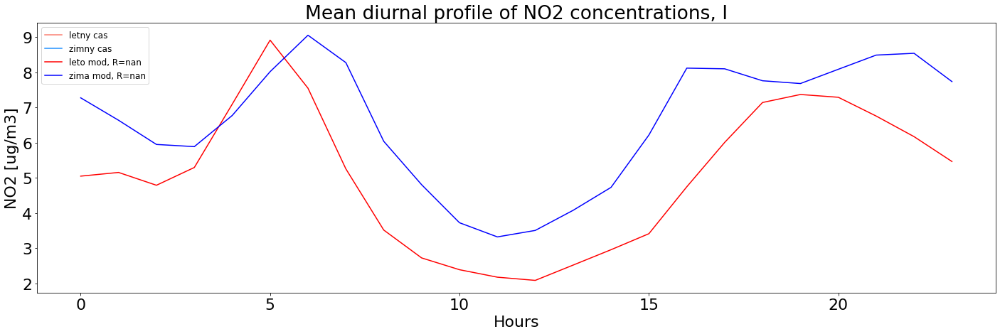

In [24]:
#TYPES
if save:
    print('Plots will be saved at:{}'.format(save_path))
for t in all_types:
    if t in locs:
        col = 'loc'
    else:
        col = 'type'    

    selected_stations = list(stat_all.loc[stat_all[col] == t].index)
    obs_id_leto = data[specific[0]]['OBS'].sel(station = selected_stations, time = data[specific[0]].time.dt.month.isin(season_months[sum_time])).groupby('time.hour').mean().mean(dim = 'station')
    obs_id_zima = data[specific[0]]['OBS'].sel(station = selected_stations, time = data[specific[0]].time.dt.month.isin(season_months[win_time])).groupby('time.hour').mean().mean(dim = 'station')
    
    mod_id_leto = data[spec_nick]['MOD'].sel(station = selected_stations, time = data[spec_nick].time.dt.month.isin(season_months[sum_time])).groupby('time.hour').mean().mean(dim = 'station')
    mod_id_zima = data[spec_nick]['MOD'].sel(station = selected_stations, time = data[spec_nick].time.dt.month.isin(season_months[win_time])).groupby('time.hour').mean().mean(dim = 'station')
    
    r_leto = mod_id_leto.to_series().corr(obs_id_leto.to_series())
    r_zima = mod_id_zima.to_series().corr(obs_id_zima.to_series())
    
    name_sta = stat[specific[0]].name.loc[stat[specific[0]].index == i].item()
    
    plt.rcParams['figure.figsize'] = 20,7
    plt.rcParams.update({'font.size': 22})

    plt.plot(obs_id_leto.hour, obs_id_leto[:], color ='salmon', label = 'Summer observed') 
    plt.plot(obs_id_zima.hour, obs_id_zima[:], color ='dodgerblue', label = 'Winter observed')
    
    plt.plot(mod_id_leto.hour, mod_id_leto[:], color ='red', label = 'Summer modeled, R={:0.2f}'.format(r_leto))
    plt.plot(mod_id_zima.hour, mod_id_zima[:], color ='blue', label = 'Winter modeled, R={:0.2f}'.format(r_zima))

    plt.legend(fontsize=12)                
    plt.title('Mean diurnal profile of {0} concentrations, {1}'.format(v,t))                               
    plt.xlabel('Hours')
    plt.ylabel('{0} [{1}]'.format(v,units))
    plt.tight_layout()
    
    if save:
        plt.savefig('{0}/MDPSW_{1}_{2}_{3}_{4}.png'.format(graphs_path,nick,v,t,spec_nick), dpi=300) 
    
    plt.show()                
    plt.close() 

# Sezonality statistics

Seasonality parameters in this section help determine the seasonal variation in concentrations.

f_ws parameter = mean winter/summer concentrations (taken from dec-feb for winter and jun-aug for summer)

d_ws parameter = mean winter - mean summer concentrations

In [37]:
seasonality_path = '{0}/seasonality'.format(save_path)
if not os.path.exists(seasonality_path):
            os.makedirs(seasonality_path)

## All stations

In [27]:
#ID = list(stat_all.index.values)[:]
ID = list(stat_all.index.values)

fzl = stat[specific[0]][['name','loc','type','coverage']].copy()
zl = stat[specific[0]][['name','loc','type','coverage']].copy()

for i in ID:
    #print(i)
    if i == 'all':
        zima = data['ref']['OBS'].sel(time = data[specific[0]].time.dt.month.isin(season_months['winter'])).mean()
        leto = data['ref']['OBS'].sel(time = data[specific[0]].time.dt.month.isin(season_months['summer'])).mean()
        obs_mean = data['ref']['OBS'].sel(time = data[specific[0]].time.dt.month.isin(season_months['year'])).mean()
    else:
        zima = data['ref']['OBS'].sel(station = i, time = data[specific[0]].time.dt.month.isin(season_months['winter'])).mean()
        leto = data['ref']['OBS'].sel(station = i, time = data[specific[0]].time.dt.month.isin(season_months['summer'])).mean()
        obs_mean = data['ref']['OBS'].sel(station = i, time = data[specific[0]].time.dt.month.isin(season_months['year'])).mean()
    
    fzl.at[i, 'fzl_obs'] = zima/leto
    zl.at[i, 'zl_obs'] = (zima - leto)/obs_mean

    for s in specific:
        if i == 'all':
            zima = data[s]['MOD'].sel(time = data[specific[0]].time.dt.month.isin(season_months['winter'])).mean()
            leto = data[s]['MOD'].sel(time = data[specific[0]].time.dt.month.isin(season_months['summer'])).mean()
            mod_mean = data[s]['MOD'].sel(time = data[specific[0]].time.dt.month.isin(season_months['year'])).mean()
        else:
            zima = data[s]['MOD'].sel(station = i, time = data[s].time.dt.month.isin(season_months['winter'])).mean()
            leto = data[s]['MOD'].sel(station = i, time = data[s].time.dt.month.isin(season_months['summer'])).mean()
            mod_mean = data[s]['MOD'].sel(station = i, time = data[s].time.dt.month.isin(season_months['year'])).mean()
        
        if zima != np.nan and leto != np.nan:
            fzl.at[i, 'fzl_{0}'.format(s)] = zima/leto
            zl.at[i, 'zl_{0}'.format(s)] = (zima - leto)/mod_mean
        else:
            fzl.at[i, 'fzl_{0}'.format(s)] = np.nan
            zl.at[i, 'zl_{0}'.format(s)] = np.nan

fzl

/data/juraj/anaconda/envs/supergeo/lib/python3.8/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)
/data/juraj/anaconda/envs/supergeo/lib/python3.8/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)
/data/juraj/anaconda/envs/supergeo/lib/python3.8/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)
/data/juraj/anaconda/envs/supergeo/lib/python3.8/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)
/data/juraj/anaconda/envs/supergeo/lib/python3.8/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)
/data/juraj/anaconda/envs/supergeo/lib/python3.8/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return 

,name,loc,type,coverage,fzl_obs,fzl_ref,fzl_cop,fzl_rh_const,fzl_tot_const
all,all,all,all,94.0813,1.970908,2.802649,2.760305,2.615574,2.114373
11813,"BRATISLAVA, JESENIOVA",S,B,94.0982,3.375378,2.569855,2.515637,2.399293,1.937843
11916,"CHOPOK, EMEP",R,B,50.6735,0.758246,2.605198,2.564316,2.512976,2.210631
11952,"GANOVCE, METEO. ST.",R,B,95.8333,2.533596,2.395468,2.342771,2.214179,1.738220
11958,KOJSOVSKA HOLA,R,B,96.7009,1.574554,2.665263,2.632023,2.558656,2.224852
99111,"BRATISLAVA, MAMATEYOVA",U,B,95.1826,2.103167,2.147870,2.114153,2.056090,1.660880
99112,"BRATISLAVA, TRNAVSKE MYTO",U,T,90.7877,1.155760,2.569855,2.515637,2.399293,1.937843
99114,"BRATISLAVA, KAMENNE NAM.",U,B,0,NaN,2.569855,2.515637,2.399293,1.937843
99117,BRATISLAVA - RACA,None,None,0,NaN,2.760106,2.695305,2.591569,2.145198
99122,"SENICA, HVIEZDOSLAVOVA",U,T,0,NaN,3.834957,3.783678,3.625127,2.853854


### f_ws plot for selected stations

In [33]:
save = False

station_list = list(stat_all.loc[stat_all['type'] == 'B'].loc[stat_all.coverage != 0].index.values)

color_list = ['darkred','slateblue','orange','green','darkorchid']

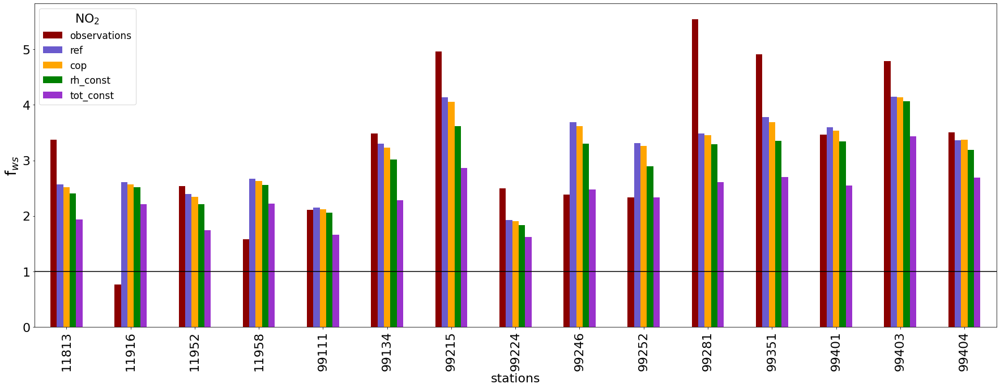

In [34]:
plt.rcParams['figure.figsize'] = 25,10
plt.rcParams.update({'font.size': 22})

fzl.loc[station_list,list(fzl.columns)[4:]].plot.bar(color=color_list)
# PLOT VSETKYCH STANIC S NAZVAMI (ROZMER ZADAT 40,8) 
#fzl.plot.bar(x = 'name',y = ['fzl_obs','fzl_orig','fzl_rh_const','fzl_tot_const'],color=['darkred','slateblue','orange','green'])
# PLOT VSETKYCH STANIC S KODOM (ROZMER ZADAT 40,8)
#fzl.iloc[:,4:].plot.bar(color=['darkred','slateblue','orange','green'])
plt.legend(["observations", "ref", "cop", 'rh_const','tot_const'],title='NO$_{2}$',fontsize=17)
plt.axhline(y=1,color='black')
plt.ylabel('f$_{ws}$', fontsize=26)
plt.xlabel('stations', fontsize=22)
plt.tight_layout()

if save:
    plt.savefig('{0}/fws_{1}_{2}.png'.format(seasonality_path,nick,v), dpi=300)
    
plt.show()
plt.close()

### d_ws plot for selected stations

In [35]:
save = False

station_list = list(stat_all.loc[stat_all['type'] == 'B'].loc[stat_all.coverage != 0].index.values)

color_list = ['darkred','slateblue','orange','green','darkorchid']

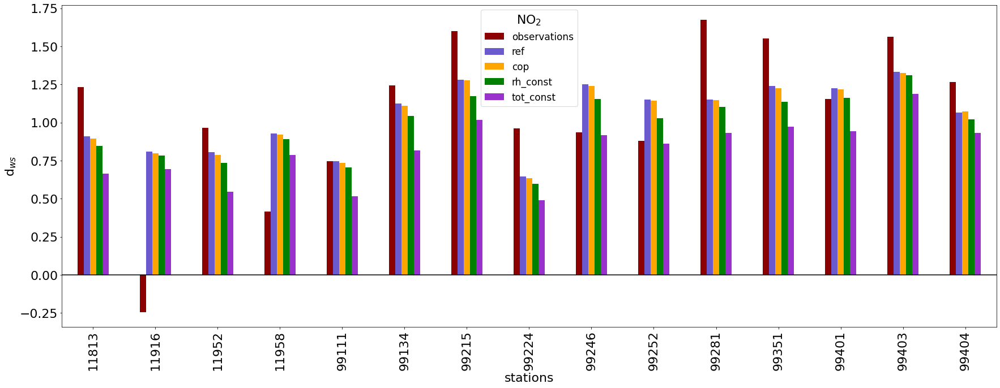

In [36]:
plt.rcParams['figure.figsize'] = 25,10
plt.rcParams.update({'font.size': 22})
zl.loc[station_list,list(zl.columns)[4:]].plot.bar(color=color_list)
#zl.iloc[:,4:].plot.bar(color=['darkred','slateblue','orange','green'])
plt.legend(["observations", "ref", "cop", 'rh_const','tot_const'],title='NO$_{2}$',fontsize=17)
plt.axhline(y=0,color='black')
#plt.ylabel('Mean winter - summer conc. $[\mu g . m^{-3}]$', fontsize=22)  #18
plt.ylabel('d$_{ws}$', fontsize=22)  #18
plt.xlabel('stations', fontsize=22)
plt.tight_layout()

if save:
    plt.savefig('{0}/dws_{1}_{2}.png'.format(seasonality_path,nick,v), dpi=300)
    
plt.show()
plt.close()

## Station types 

In [38]:
fzl_types = pd.DataFrame(index = all_types, columns = ['count']+list(fzl.columns)[3:], dtype = 'float64')
zl_types = pd.DataFrame(index = all_types, columns = ['count']+list(zl.columns)[3:], dtype = 'float64')
for t in all_types:
    if t in locs:
        col = 'loc'
    else:
        col = 'type'
        
    selected_stations = list(stat_all.loc[stat_all[col] == t].loc[stat_all['coverage'] != 0].index)
    fzl_types.at[t,'count'], zl_types.at[t,'count']  = len(selected_stations), len(selected_stations)
    obs = data['ref']['OBS'].sel(station = selected_stations, time = data['ref'].time.dt.month.isin(season_months['year'])).to_series()
    zima = data['ref']['OBS'].sel(station = selected_stations, time = data['ref'].time.dt.month.isin(season_months['winter'])).mean()
    leto = data['ref']['OBS'].sel(station = selected_stations, time = data['ref'].time.dt.month.isin(season_months['summer'])).mean()    
    coverage = 100*(len(obs) - obs.isna().sum())/len(obs)
    fzl_types.at[t,'coverage'], zl_types.at[t,'coverage'] = coverage, coverage
    obs_mean = np.mean(obs)
    
    fzl_types.at[t, 'fzl_obs'] = zima/leto
    zl_types.at[t, 'zl_obs'] = (zima - leto)/obs_mean
    
    for s in specific:
        zima = data[s]['MOD'].sel(station = selected_stations, time = data[s].time.dt.month.isin(season_months['winter'])).mean()
        leto = data[s]['MOD'].sel(station = selected_stations, time = data[s].time.dt.month.isin(season_months['summer'])).mean()
        mod_mean = data[s]['MOD'].sel(station = selected_stations, time = data['ref'].time.dt.month.isin(season_months['year'])).mean()
        
        fzl_types.at[t, 'fzl_{0}'.format(s)] = zima/leto
        zl_types.at[t, 'zl_{0}'.format(s)] = (zima - leto)/mod_mean
    
        
zl_types

/data/juraj/anaconda/envs/supergeo/lib/python3.8/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)
<ipython-input-38-d70208f0b4d1>:14: RuntimeWarning: invalid value encountered in long_scalars
  coverage = 100*(len(obs) - obs.isna().sum())/len(obs)


,count,coverage,zl_obs,zl_ref,zl_cop,zl_rh_const,zl_tot_const
S,1.0,94.098174,1.231943,0.911068,0.895260,0.846616,0.664385
R,6.0,88.852740,0.953653,1.031542,1.017790,0.976053,0.812777
U,18.0,95.823186,0.689742,0.977166,0.965805,0.899664,0.727876
B,15.0,92.994673,1.052821,0.994433,0.983455,0.925656,0.749466
T,10.0,95.711187,0.522825,0.961121,0.947934,0.881682,0.715068
I,0.0,NaN,NaN,NaN,NaN,NaN,NaN


### f_ws plot for station types

In [33]:
save = False

color_list = ['darkred','slateblue','orange','green','darkorchid']

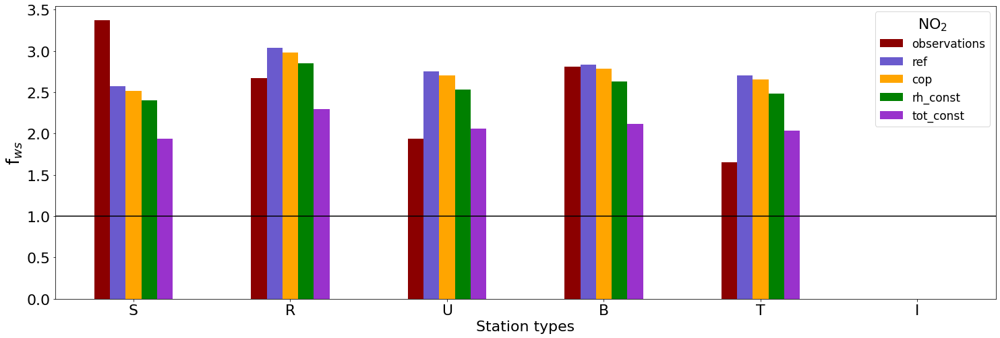

In [39]:
plt.rcParams['figure.figsize'] = 25,8
plt.rcParams.update({'font.size': 22})
fzl_types.iloc[:,2:].plot.bar(color=color_list, rot=0)
plt.legend(["observations", "ref", "cop", 'rh_const','tot_const'],title='NO$_{2}$',fontsize=17)
plt.axhline(y=1,color='black')
plt.ylabel('f$_{ws}$', fontsize=26)
plt.xlabel('Station types', fontsize=22)
    
if save:
    plt.savefig('{0}/fws_station_types_{1}_{2}.png'.format(seasonality_path,nick,v), dpi=300)
    
plt.show()
plt.close()

### d_ws plot for station types

In [40]:
save = False

station_list = list(stat_all.loc[stat_all['type'] == 'B'].loc[stat_all.coverage != 0].index.values)

color_list = ['darkred','slateblue','orange','green','darkorchid']

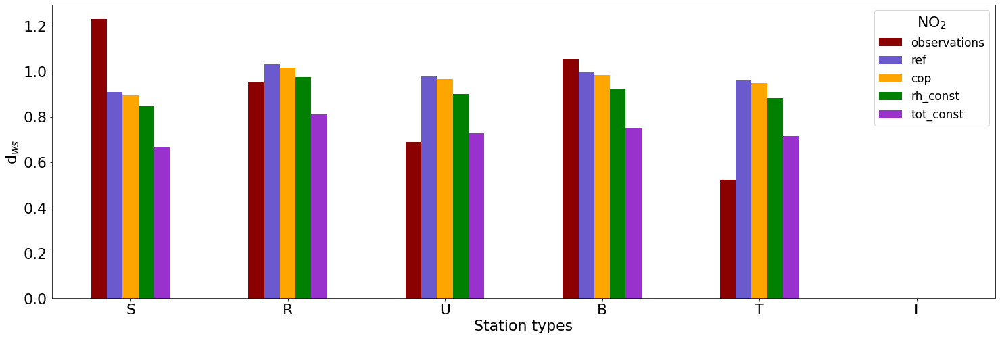

In [42]:
plt.rcParams['figure.figsize'] = 25,8
plt.rcParams.update({'font.size': 22})
zl_types.iloc[:,2:].plot.bar(color=color_list, rot=0)
plt.legend(["observations", "ref", "cop", 'rh_const','tot_const'],title='NO$_{2}$',fontsize=17)
plt.axhline(y=0,color='black')
#plt.ylabel('Mean winter - summer conc. $[\mu g . m^{-3}]$', fontsize=22)  #18
plt.ylabel('d$_{ws}$', fontsize=22)  #18
plt.xlabel('Station types', fontsize=22)
    
if save:
    plt.savefig('{0}/dws_station_types_{1}_{2}.png'.format(seasonality_path,nick,v), dpi=300)
    
plt.show()
plt.close()